In [1]:
import time
import numpy as np
import gymnasium as gym
import tqdm
from nlk1000_gym import NLK_Env
import matplotlib.pyplot as plt

# Register the environment
gym.register(
    id='NLK_Env-v0',
    entry_point='nlk1000_gym_onestep:NLK_Env'
)
env = gym.make('NLK_Env-v0')

import stable_baselines3
from stable_baselines3 import TD3
from stable_baselines3.common.noise import NormalActionNoise, OrnsteinUhlenbeckActionNoise

n_actions = 2     #2 dimensional action space



network_sizes = [        #list of network sizes we want to optimise over
    [256], [128], [256, 128], 
    [32,32,16],[64,64],[32,32]
]



from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

class NLK_Sampler:
    #this class is used to sample new electrons
    def __init__(self):
        self.lower = np.array([0.01242802014328473,-2.3510967845422677,    #lower polynom weights, for injection area
                                 135.64889234592374,-2621.6674111929387,8374.6738385004])   
        self.upper = np.array([-0.026705410090359233,6.412451482988342,  #upper polynom weights, for injection area
                                 -549.8383734808201,20891.368558370945,-298723.030031348])
        self.diff = self.upper-self.lower
        self.transform = np.array([-3.2911361375977704,102.00328087158005,
                                   15593.102791660853,-518062.7698926044])
        self.poly = PolynomialFeatures(degree=4)
        self.poly_transform = PolynomialFeatures(degree=3)
    
    def sample(self):
        x = np.random.uniform(size=(1,1))
        x = x**1.8       #fixing term, not known why to use
        x = x*(22.85e-3-15e-3)+15e-3

        x_poly = self.poly_transform.fit_transform(x)
        x = x_poly@self.transform
        x = x*(22.85e-3-15e-3)+15e-3

        x = np.array([[x[0]]])
        

        height = np.random.uniform()
        x_poly = self.poly.fit_transform(x)   #to x^0,x^1,...,x^4
        y = x_poly@self.lower + height*x_poly@self.diff
        return x[0,0],y[0]
    
nlk_sampler = NLK_Sampler()

In [2]:
def model_performance(model, deterministic = True):
    env = gym.make('NLK_Env-v0', deterministic = deterministic) #environment is made deterministic, to make performances comparable
    x_list = np.linspace(15e-3,22.85e-3,360)  #xlist in m. 
    px_list = np.linspace(-0.0008,0.0012,180)  #pxlist in rad
    
    Z = np.zeros((360,180))         #save performances
    Z_round = np.zeros((360,180))   #save kicked rounds

    poly = PolynomialFeatures(degree=4)
    nlk_sampler = NLK_Sampler()
        
    new_list = []
    counter = 0
    reward_sum = 0
    for i in range(len(x_list)): 
        x_poly = poly.fit_transform(np.array([[x_list[i]]]))
        #for the x value calculate the lower and upper value of the injection area

        x_lower = x_poly@nlk_sampler.lower
        x_upper = x_poly@nlk_sampler.upper
        
        for j in range(len(px_list)):
            info = []
            if px_list[j]>x_lower and px_list[j]<x_upper: #check if x,px value is in injection area
                reward, round_kicked = performance_on_point(model,x_list[i],px_list[j],env) #check performance
                 
                reward *= 1000 # normalise reward
                reward_sum += reward
                
                Z[i,j] = reward
                Z_round[i,j] = round_kicked
                
                counter+=1
            else:
                #if not in the injection area, return nan
                Z[i,j] = np.nan
                Z_round[i,j] = np.nan

    return reward_sum/counter, Z, Z_round

def performance_on_point(model,x,px,env):
    
    round_kicked = np.nan
    obs, info = env.reset(options = {"x,px":(x,px)}) #reset environment
    
    action, _states = model.predict(obs)
    round_kicked = (action[0]+1)*5   #calculate in which round kicked, to return the value
    
    obs, reward, done,_, _ = env.step(action)
    return reward, round_kicked

In [17]:
from matplotlib import colors


def show_plots(Z, Z_round):
    """
    create the plots
    """
    x_list = np.linspace(15e-3,22.85e-3,360)
    px_list = np.linspace(-0.0008,0.0012,180)

    fig, ax = plt.subplots(figsize=(9,5))

    pc = ax.pcolormesh(x_list*1000,px_list*1000,Z.T,shading='auto')
    fig.colorbar(pc)

    plt.title(f"Model performance, in own env")
    plt.ylabel("px in mrad")
    plt.xlabel("x in mm")
    plt.show()

    
    fig, ax = plt.subplots(figsize=(9,5))

    pc = ax.pcolormesh(x_list*1000,px_list*1000,Z_round.T,shading='auto')
    
    fig.colorbar(pc)

    plt.title(f"In which round model kicked, in own env")
    plt.ylabel("px in mrad")
    plt.xlabel("x in mm")
    plt.show()

In [8]:
model = TD3.load(f"best_1000elec_1step")

In [9]:
value, Z, Z_round = model_performance(model)
value

600.1290476589118

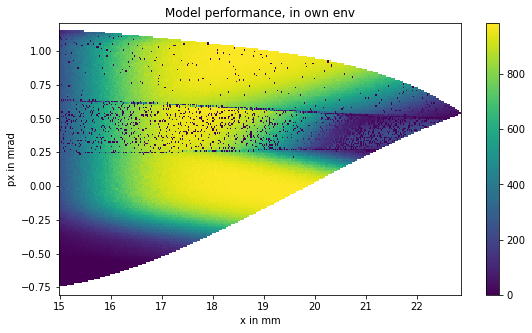

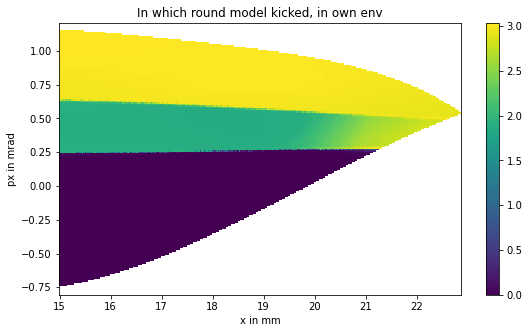

In [18]:
show_plots(Z, Z_round)

In [4]:
import torch as th
from torch import nn

from stable_baselines3.common.torch_layers import BaseFeaturesExtractor


#used feature extractor/ function that transforms the histogram plot to a 4dim vector
class CustomCombinedExtractor(BaseFeaturesExtractor):
    #modified code from https://stable-baselines3.readthedocs.io/en/master/guide/custom_policy.html#custom-feature-extractor
    def __init__(self, observation_space: gym.spaces.Dict):
        # We do not know features-dim here before going over all the items,
        # so put something dummy for now. PyTorch requires calling
        # nn.Module.__init__ before adding modules
        super().__init__(observation_space, features_dim=1)

        extractors = {}

        total_concat_size = 0
        # We need to know size of the output of this extractor,
        # so go over all the spaces and compute output feature sizes
        for key, subspace in observation_space.spaces.items():
            if key == "image":
                # We assume CxHxW images (channels first)
                # Assume the image is single-channel (subspace.shape[0] == 1)
                extractors[key] = nn.Sequential(
                        nn.Conv2d(1, 8, kernel_size=6, stride=2, padding=0),
                        nn.ReLU(),
                        nn.MaxPool2d(2),
                        nn.Conv2d(8, 4, kernel_size=3, stride=1, padding=0),
                        nn.ReLU(),
                        nn.MaxPool2d(2),
                        nn.Conv2d(4, 4, kernel_size=2, stride=1, padding=0),
                        nn.ReLU(),
                        nn.Conv2d(4, 2, kernel_size=2, stride=1, padding=0),
                        nn.ReLU(),
                        nn.Flatten(),
                        nn.Linear(8,4),
                    )
                
                # Compute shape by doing one forward pass
                with th.no_grad():
                    n_flatten = extractors[key](
                        th.as_tensor(observation_space.sample()["image"][None]).float()
                    ).shape[1]

                total_concat_size += n_flatten
            elif key == "x,px mean":
                # Run through Identity
                extractors[key] = nn.Identity()
                total_concat_size += 2
            
                
        self.extractors = nn.ModuleDict(extractors)
        

        # Update the features dim manually
        self._features_dim = total_concat_size
        
        
    def forward(self, observations) -> th.Tensor:
        encoded_tensor_list = []

        # self.extractors contain nn.Modules that do all the processing.
        for key, extractor in self.extractors.items():
            encoded_tensor_list.append(extractor(observations[key]))
        # Return a (B, self._features_dim) PyTorch tensor, where B is batch dimension.
        return th.cat(encoded_tensor_list, dim=1)

In [5]:
def train(batch_size,learning_rate,noise_std,size_pi,size_qf,duration,gamma = 0.975,learning_starts=100):
    #pecial Inputs: -duration in hours
    #               -size_pi and size_qf as indicies for network_sizes list
    env = gym.make('NLK_Env-v0')  #create env
    action_noise = OrnsteinUhlenbeckActionNoise(mean=np.zeros(n_actions),    #set action noise
                                                sigma=noise_std*np.ones(n_actions))

    policy_kwargs = dict(features_extractor_class=CustomCombinedExtractor,  #set feature extractor and 
                         net_arch=dict(pi=network_sizes[size_pi],   #policy network
                                       qf=network_sizes[size_qf]))   #value function

    model = TD3("MultiInputPolicy", env, action_noise=action_noise, verbose=1, learning_rate=learning_rate,
                    batch_size=batch_size, gamma=gamma, policy_kwargs=policy_kwargs,learning_starts=learning_starts,#2000,
                buffer_size=20000)

    env = model.get_env()

    a = time.time()
    while time.time()-a<60*60*duration:
        model.learn(total_timesteps=2000, log_interval=3000)
    return model

Here we already knew good hyperparameters and searched for the best model

The best found model is found under number 2 

---------------------
0
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 540.0292149706908


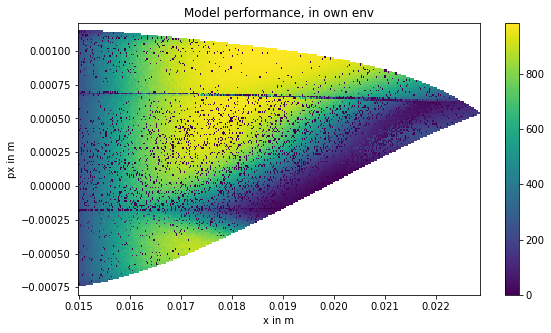

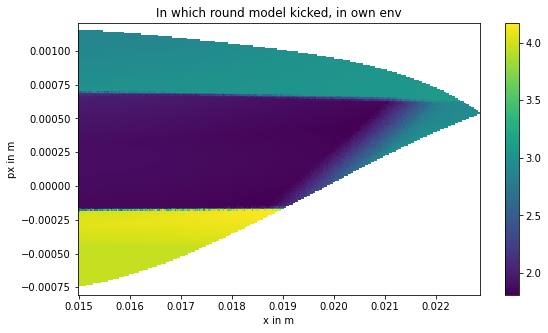

---------------------
1
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 555.3280543762077


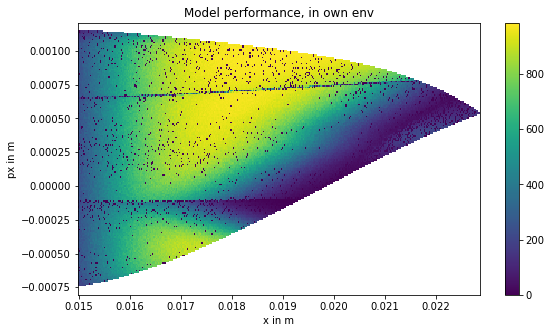

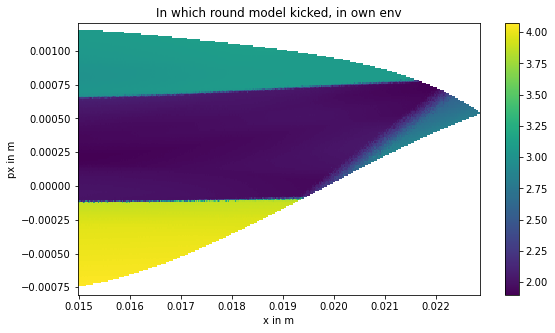

---------------------
2
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 599.9881434955252


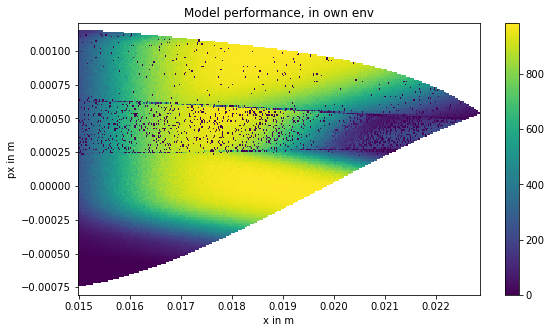

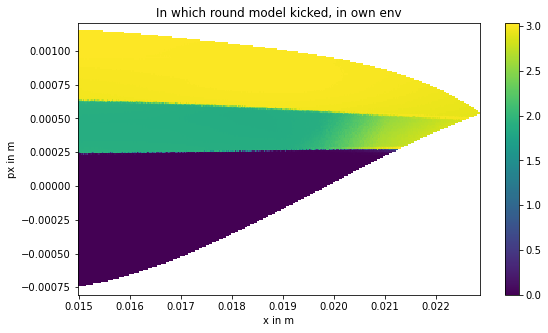

---------------------
3
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 505.2248381840052


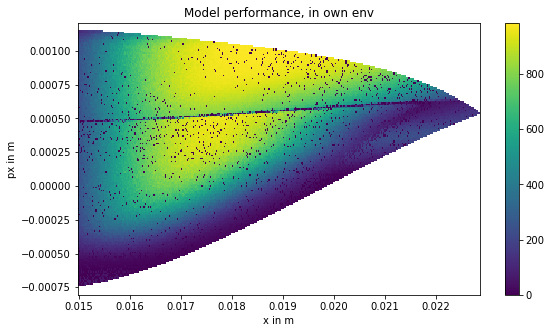

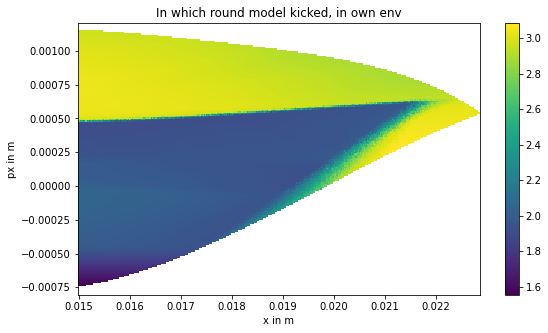

---------------------
4
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 584.8818862029183


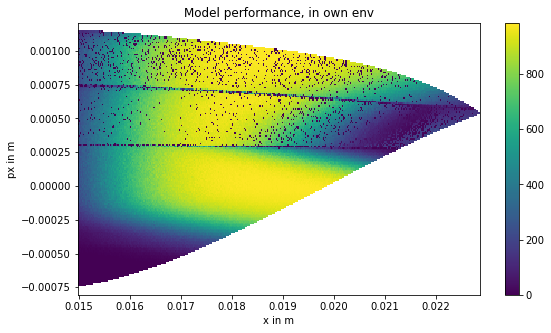

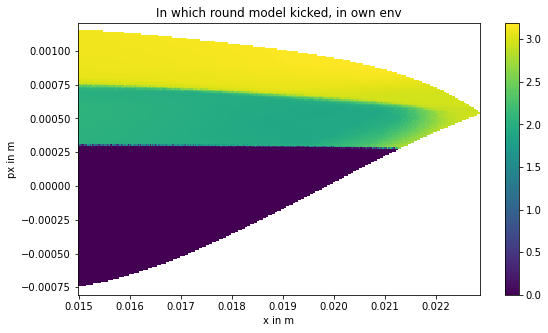

---------------------
5
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 572.0139923763494


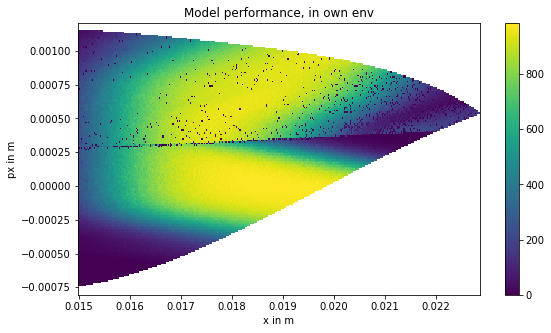

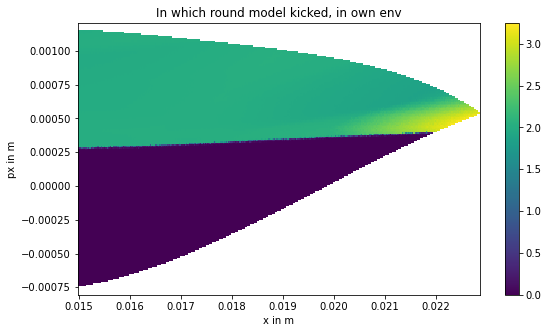

---------------------
6
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 543.743777327874


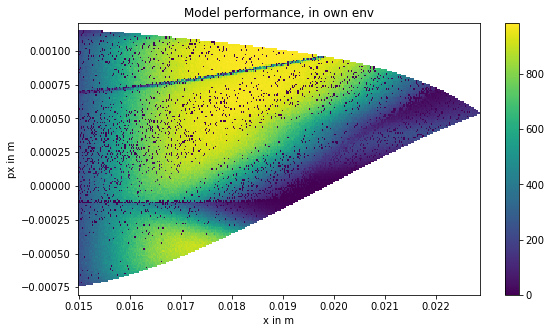

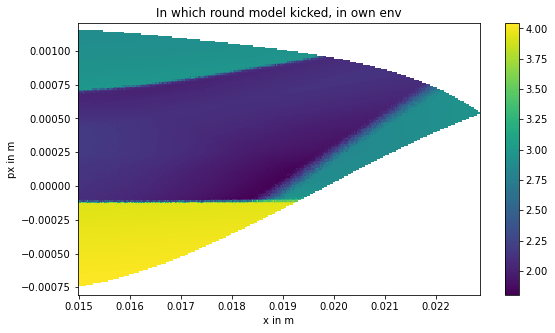

---------------------
7
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 490.8326670281971


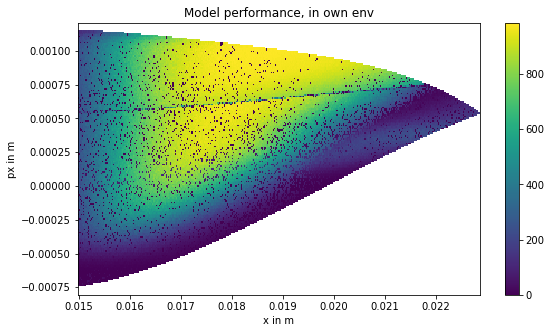

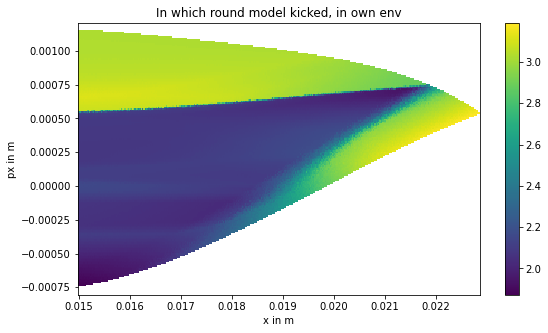

---------------------
8
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 448.7200980834394


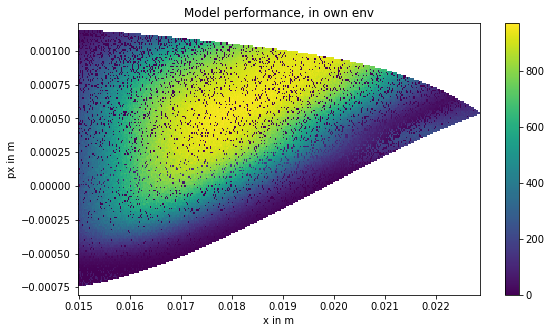

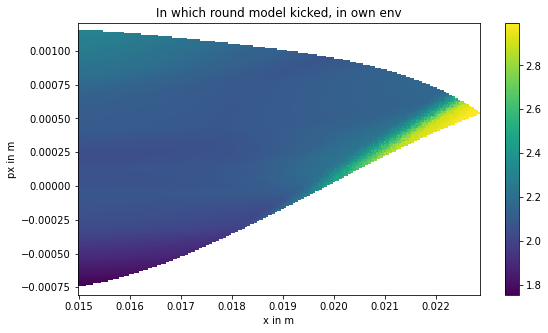

---------------------
9
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 543.8225873938067


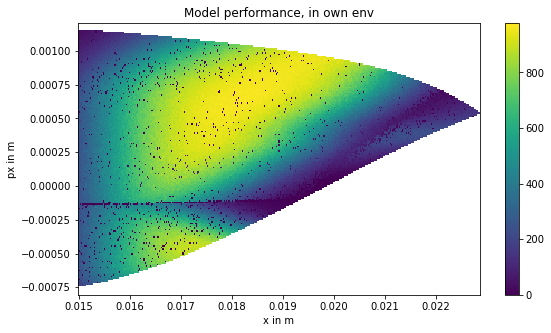

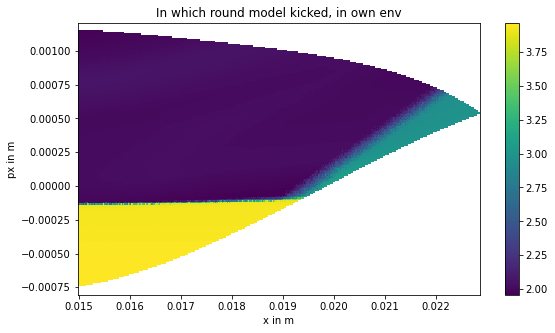

---------------------
10
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 519.7623527618243


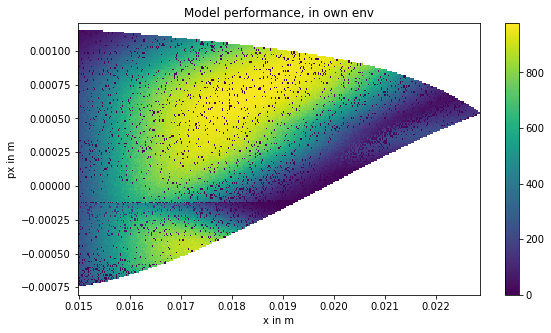

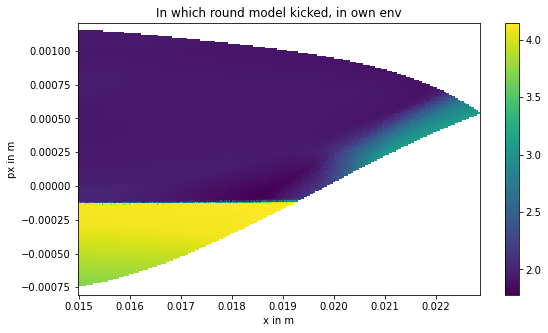

---------------------
11
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


/home/al3xber/anaconda3/lib/python3.8/site-packages/gymnasium/utils/passive_env_checker.py:159: UserWarning: WARN: The obs returned by the `step()` method is not within the observation space.
  logger.warn(f"{pre} is not within the observation space.")


Value: 551.7882918276026


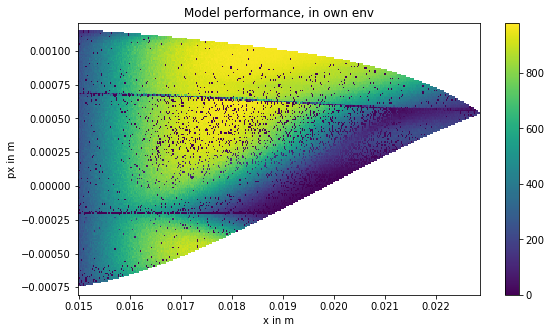

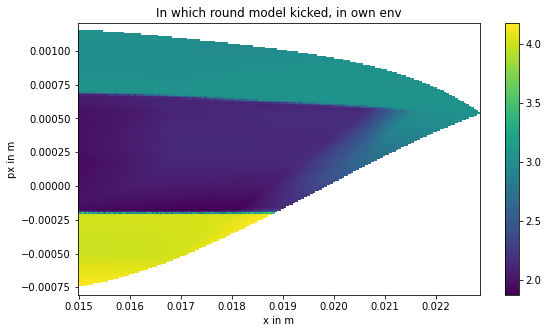

---------------------
12
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 537.2047127590284


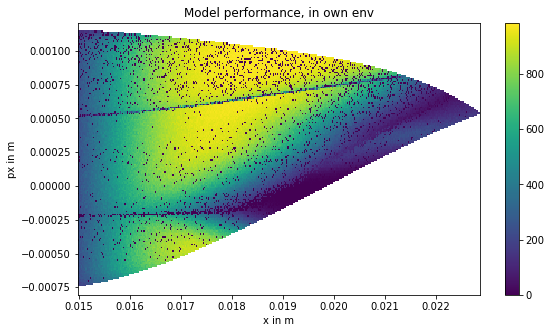

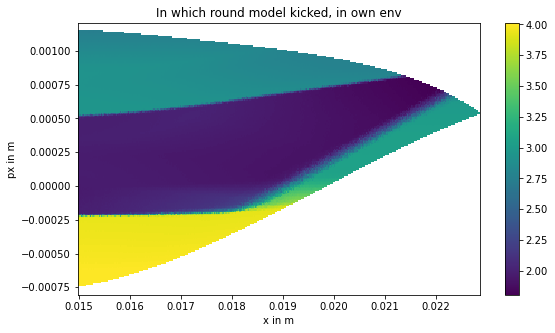

---------------------
13
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 473.1535790731296


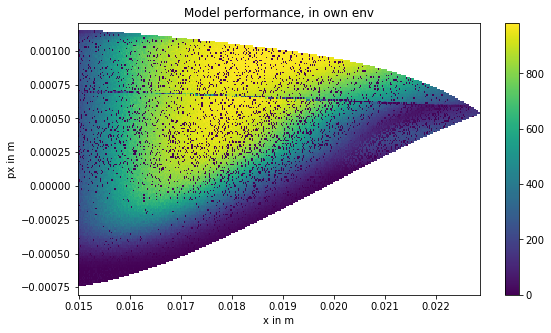

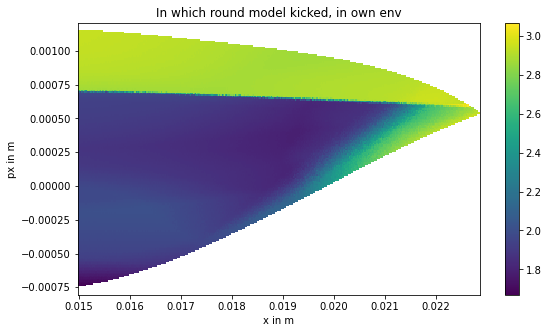

---------------------
14
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 540.1656389226765


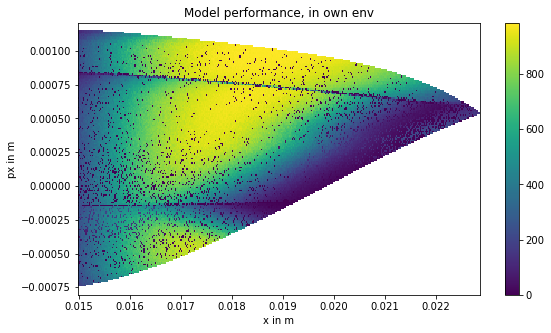

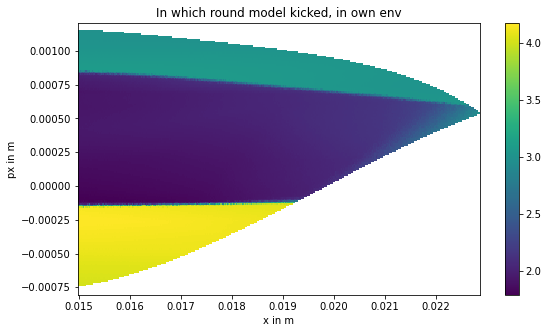

---------------------
15
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.


/home/al3xber/anaconda3/lib/python3.8/site-packages/gymnasium/utils/passive_env_checker.py:159: UserWarning: WARN: The obs returned by the `step()` method is not within the observation space.
  logger.warn(f"{pre} is not within the observation space.")


Value: 565.2606146572124


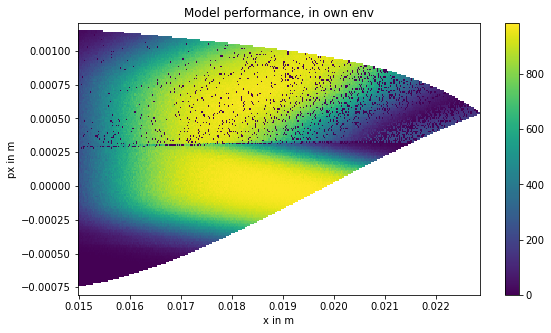

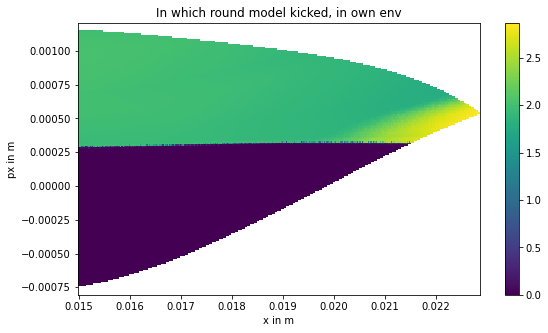

---------------------
16
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 468.01020299893446


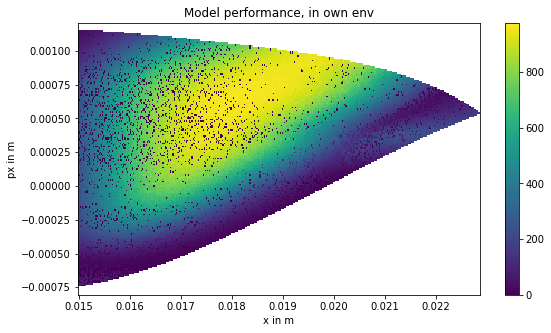

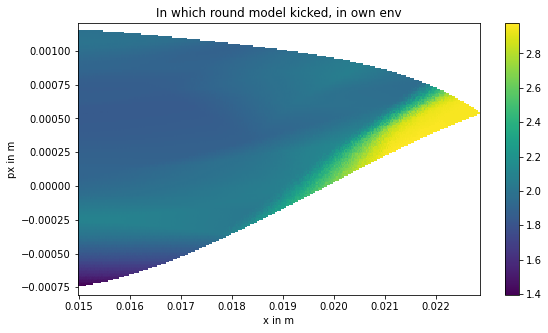

---------------------
17
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 494.59444363702664


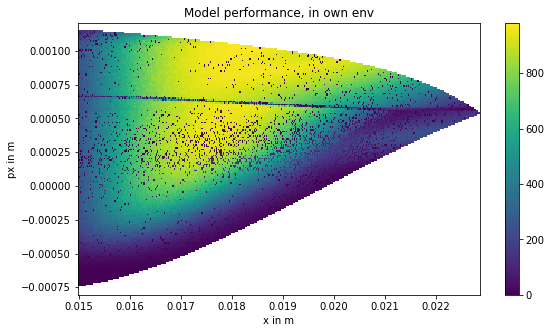

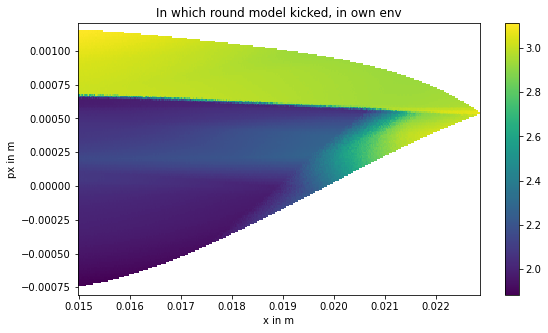

---------------------
18
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 567.1456153478973


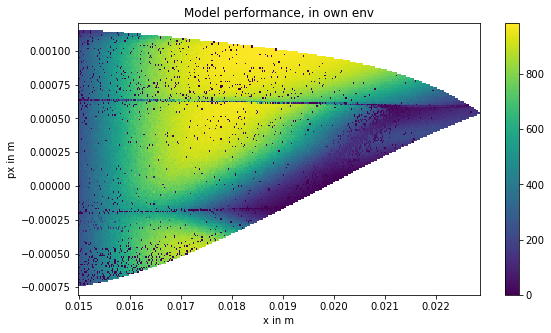

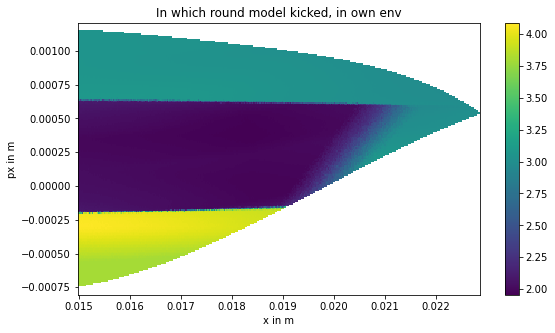

---------------------
19
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 455.3510236173161


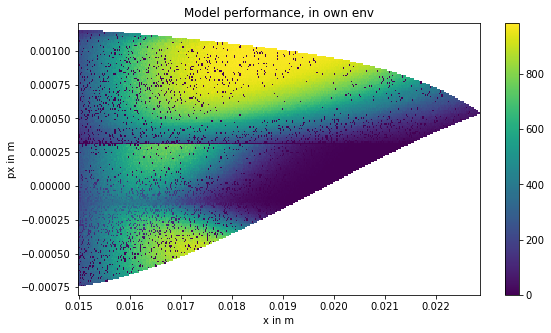

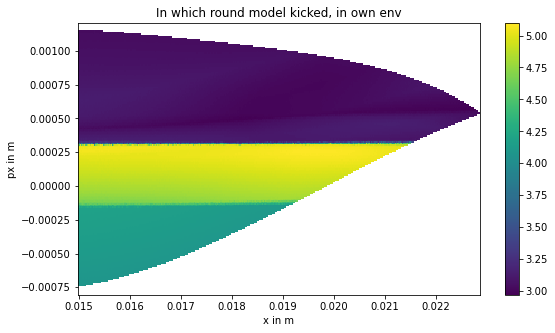

---------------------
20
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 491.51087858126454


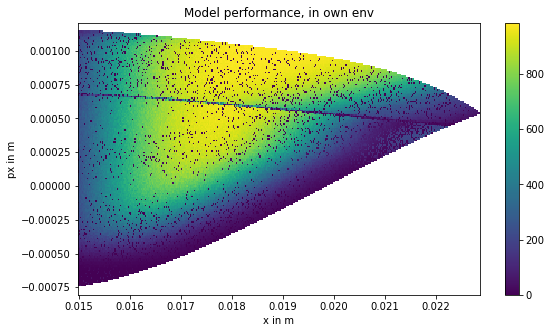

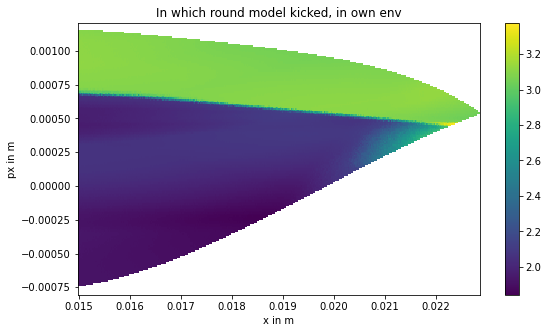

---------------------
21
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 582.1671945813555


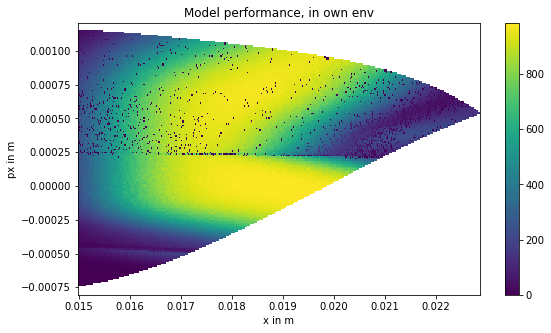

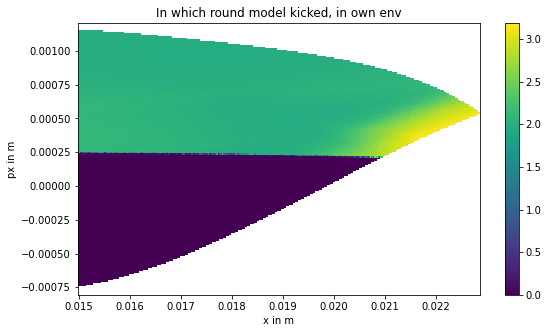

---------------------
22
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 453.4782543896994


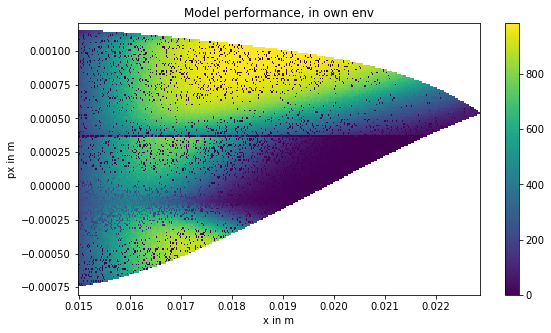

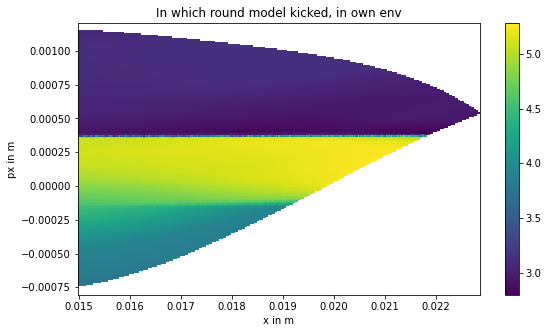

---------------------
23
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 548.6897406863854


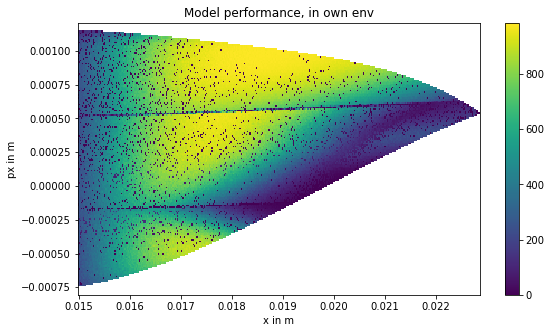

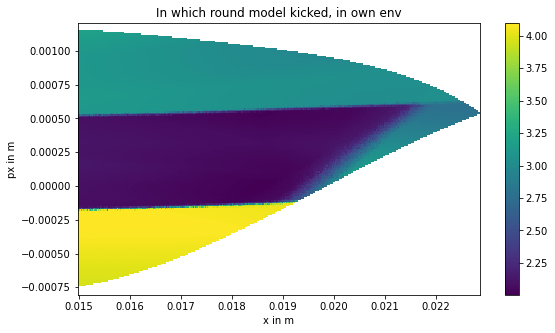

---------------------
24
---------------------
Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Value: 550.4467850925106


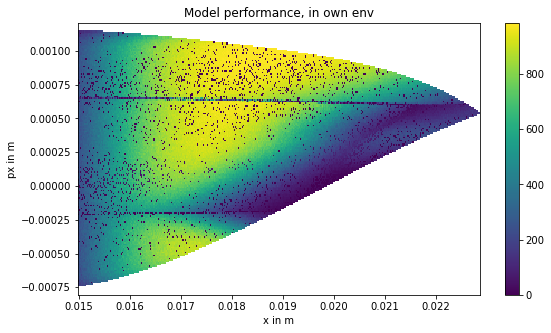

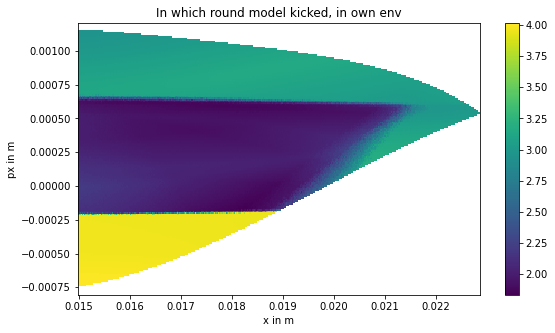

In [6]:
for i in range(25):
    print("---------------------")
    print(i)
    print("---------------------")
    model = train(batch_size=64,learning_rate=0.001,
                  noise_std=1.4777,size_pi=2,size_qf=2,duration=.1,gamma = 1,learning_starts=250) 
    
    value, Z, Z_round = model_performance(model, deterministic = True)
    print("Value:",value)
    if value>580:
        model.save(f"models/TD3/best1000_onestep_number{i}")  
    show_plots(Z, Z_round)

## Hyperparameter search

In [6]:
from hyperopt import hp, fmin, tpe, STATUS_OK, Trials, trials_from_docs

In [7]:
space = {'noise_std': hp.uniform ('noise_std', 0, 2),  #search space, the other hyperparameters were optimised already
        "learning_rate" : hp.uniform ('learning_rate', 1e-6, 5e-3),    
        'pi_NN' : hp.choice('pi_NN', network_sizes),
        'qf_NN' : hp.choice('qf_NN', network_sizes),
        }

In [8]:
def worker(space):
    env = gym.make('NLK_Env-v0')
    
    action_noise = OrnsteinUhlenbeckActionNoise(mean=np.zeros(n_actions), 
                                                sigma=space["noise_std"]*np.ones(n_actions))
    
    pi_NN = space["pi_NN"]
    qf_NN = space["qf_NN"]
    policy_kwargs = dict(features_extractor_class=CustomCombinedExtractor,
                         net_arch=dict(pi=pi_NN, qf=qf_NN))
    
    
    gamma = 1   #gamma = 1, since only 1 step
    model = TD3("MultiInputPolicy", env, action_noise=action_noise, verbose=1, 
                learning_rate=space["learning_rate"],batch_size=64, 
                gamma=1,learning_starts = 250, 
                policy_kwargs=policy_kwargs, buffer_size=20000)
    
    env = model.get_env()
    
    a = time.time()
    
    while time.time()-a<60*5:#5 minutes
        model.learn(total_timesteps=2000, log_interval=3000)

    value, Z, Z_round = model_performance(model)
    
    print("Plot for value", value)
    if value>480:
        show_plots(Z, Z_round)
        
    return value


def objective(space):
    values = []
    for runde_worker in range(3):
        werte = worker(space)
        values += [werte]
        print(values)
        if np.mean(values) < (runde_worker+1)*50:   #break earlier, in case performance is bad
            print("BREAK",np.mean(values),(runde_worker+1)*50)
            break
                
            
    #
    accuracy = np.mean(values)/100    #value
    
    # We aim to maximize accuracy, therefore we return it as a negative value
    return {'loss': -accuracy, 'action_info': {'performances': values},
            'status': STATUS_OK }
    

In [9]:
# from https://github.com/hyperopt/hyperopt/issues/267
import pickle
import os 
file_name = "NLK1000onestep_model2.hyperopt"

def run_trials():

    trials_step = 1  # how many additional trials to do after loading saved trials. 1 = save after iteration
    max_trials = 1  # initial max_trials. put something small to not have to wait
    
    try:  # try to load an already saved trials object, and increase the max
        trials = pickle.load(open(file_name, "rb"))
        print("Found saved Trials! Loading...")
        
        max_trials = len(trials.trials) + trials_step
        print("Rerunning from {} trials to {} (+{}) trials".format(len(trials.trials), max_trials, trials_step))
    except:  # create a new trials object and start searching
        print("Creating new Trial")
        trials = Trials()

    best = fmin(fn = objective,
            space = space,
            algo = tpe.suggest,
            max_evals = max_trials,
            trials = trials)

    print("Run:", best)

    #print(trials.trials)
    with open(file_name, "wb") as f:
        pickle.dump(trials, f)

Found saved Trials! Loading...
Rerunning from 2 trials to 3 (+1) trials
Using cuda device                                    
Wrapping the env with a `Monitor` wrapper            
Wrapping the env in a DummyVecEnv.                   
Plot for value                                       
495.48081323648285                                   
 67%|██████▋   | 2/3 [07:40<?, ?trial/s, best loss=?]

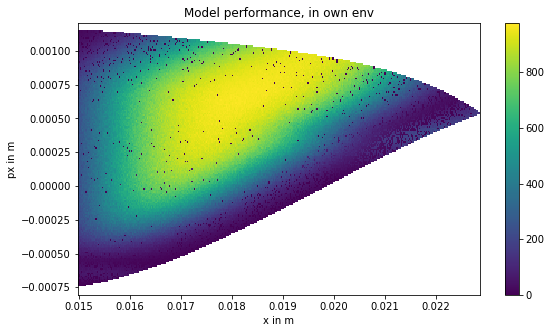

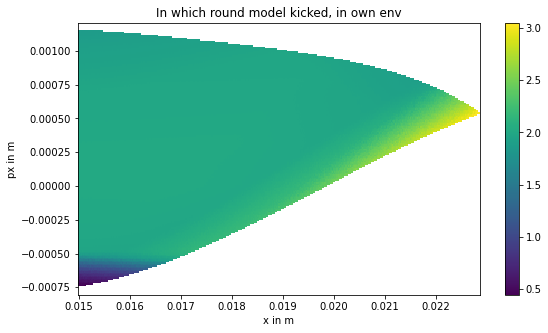

[495.48081323648285]                                 
Using cuda device                                    
Wrapping the env with a `Monitor` wrapper            
Wrapping the env in a DummyVecEnv.                   
Plot for value                                       
543.4850303882914                                    
 67%|██████▋   | 2/3 [14:58<?, ?trial/s, best loss=?]

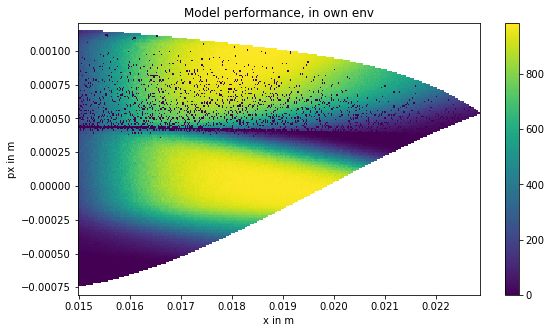

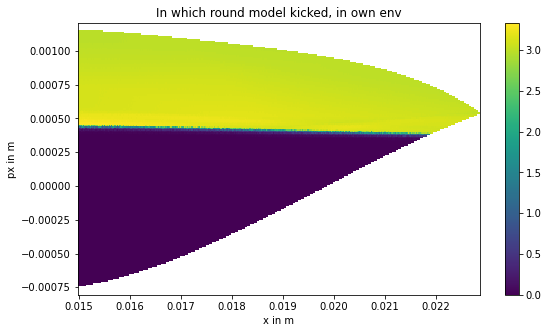

[495.48081323648285, 543.4850303882914]              
Using cuda device                                    
Wrapping the env with a `Monitor` wrapper            
Wrapping the env in a DummyVecEnv.                   
Plot for value                                       
415.3313650061784                                    
[495.48081323648285, 543.4850303882914, 415.3313650061784]
100%|██████████| 3/3 [23:26<00:00, 1406.63s/trial, best loss: -4.847657362103175]
Run: {'learning_rate': 0.002102710872616475, 'noise_std': 0.056266973577757895, 'pi_NN': 0, 'qf_NN': 0}
Found saved Trials! Loading...
Rerunning from 3 trials to 4 (+1) trials
Using cuda device                                    
Wrapping the env with a `Monitor` wrapper            
Wrapping the env in a DummyVecEnv.                   
Plot for value                                       
7.516290528254208                                    
[7.516290528254208]                                  
BREAK                              

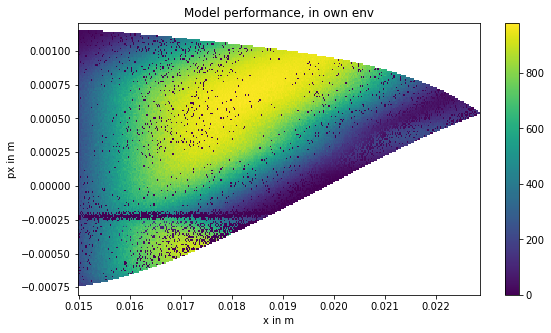

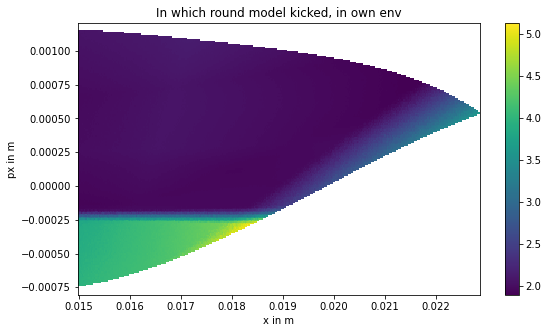

[523.783612049275]                                   
Using cuda device                                    
Wrapping the env with a `Monitor` wrapper            
Wrapping the env in a DummyVecEnv.                   
Plot for value                                       
416.657326783834                                     
[523.783612049275, 416.657326783834]                 
Using cuda device                                    
Wrapping the env with a `Monitor` wrapper            
Wrapping the env in a DummyVecEnv.                   
Plot for value                                       
467.72371157222153                                   
[523.783612049275, 416.657326783834, 467.72371157222153]
100%|██████████| 5/5 [25:05<00:00, 1505.81s/trial, best loss: -4.847657362103175]
Run: {'learning_rate': 0.002102710872616475, 'noise_std': 0.056266973577757895, 'pi_NN': 0, 'qf_NN': 0}
Found saved Trials! Loading...
Rerunning from 5 trials to 6 (+1) trials
Using cuda device                    

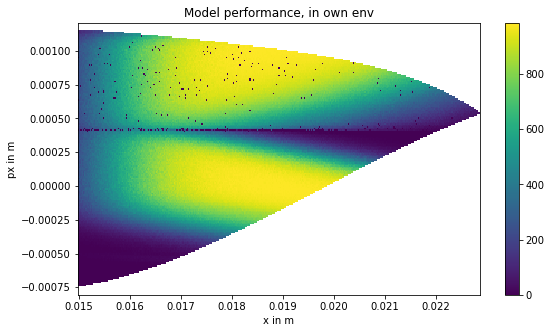

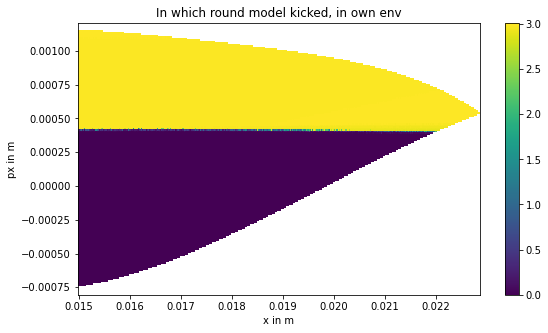

[573.5631046480332]                                  
Using cuda device                                    
Wrapping the env with a `Monitor` wrapper            
Wrapping the env in a DummyVecEnv.                   
Plot for value                                       
445.32255403700094                                   
[573.5631046480332, 445.32255403700094]              
Using cuda device                                    
Wrapping the env with a `Monitor` wrapper            
Wrapping the env in a DummyVecEnv.                   
Plot for value                                       
461.4186965150226                                    
[573.5631046480332, 445.32255403700094, 461.4186965150226]
100%|██████████| 6/6 [24:27<00:00, 1467.25s/trial, best loss: -4.934347850666856]
Run: {'learning_rate': 0.003531299942147838, 'noise_std': 0.27469590690047196, 'pi_NN': 2, 'qf_NN': 2}
Found saved Trials! Loading...
Rerunning from 6 trials to 7 (+1) trials
Using cuda device                   

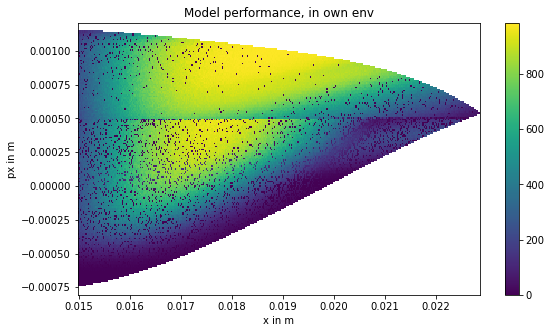

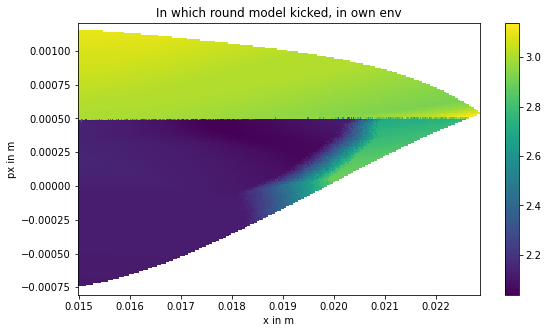

[495.0310216240021]                                  
Using cuda device                                    
Wrapping the env with a `Monitor` wrapper            
Wrapping the env in a DummyVecEnv.                   
Plot for value                                       
333.1089978808554                                    
[495.0310216240021, 333.1089978808554]               
Using cuda device                                    
Wrapping the env with a `Monitor` wrapper            
Wrapping the env in a DummyVecEnv.                   
Plot for value                                       
505.5395442474244                                    
 86%|████████▌ | 6/7 [25:28<?, ?trial/s, best loss=?]

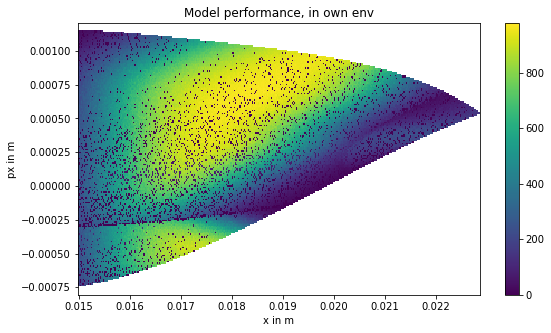

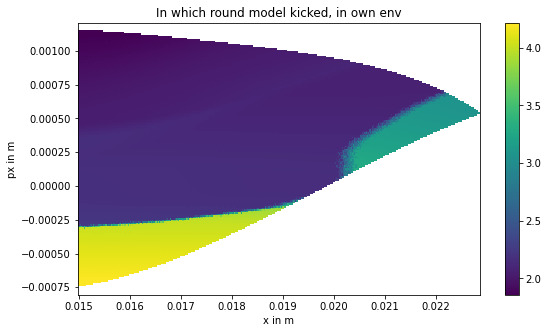

[495.0310216240021, 333.1089978808554, 505.5395442474244]
100%|██████████| 7/7 [25:28<00:00, 1528.87s/trial, best loss: -4.934347850666856]
Run: {'learning_rate': 0.003531299942147838, 'noise_std': 0.27469590690047196, 'pi_NN': 2, 'qf_NN': 2}
Found saved Trials! Loading...
Rerunning from 7 trials to 8 (+1) trials
Using cuda device                                    
Wrapping the env with a `Monitor` wrapper            
Wrapping the env in a DummyVecEnv.                   
Plot for value                                       
492.5989568202068                                    
 88%|████████▊ | 7/8 [07:45<?, ?trial/s, best loss=?]

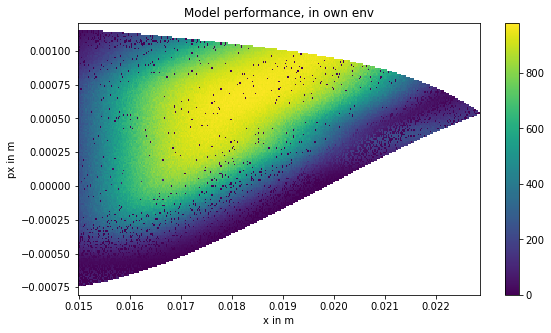

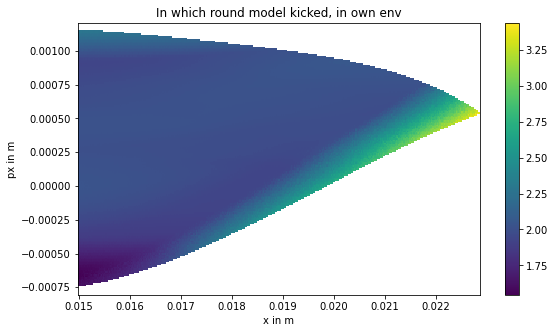

[492.5989568202068]                                  
Using cuda device                                    
Wrapping the env with a `Monitor` wrapper            
Wrapping the env in a DummyVecEnv.                   
Plot for value                                       
487.15666737436516                                   
 88%|████████▊ | 7/8 [15:28<?, ?trial/s, best loss=?]

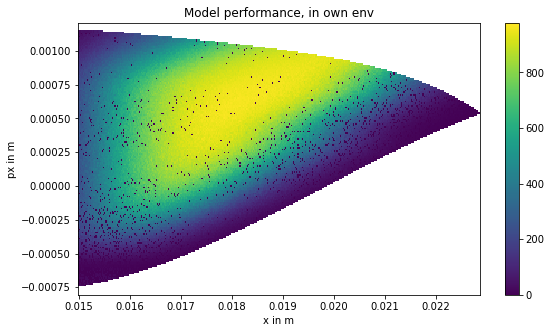

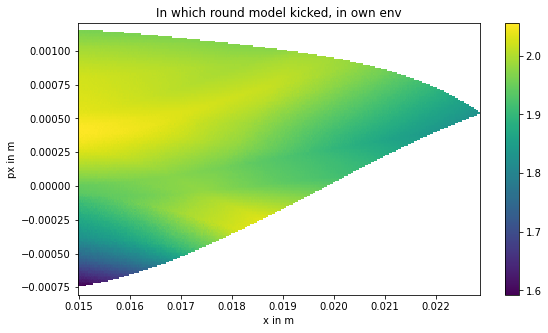

[492.5989568202068, 487.15666737436516]              
Using cuda device                                    
Wrapping the env with a `Monitor` wrapper            
Wrapping the env in a DummyVecEnv.                   
Plot for value                                       
399.30218463737333                                   
[492.5989568202068, 487.15666737436516, 399.30218463737333]
100%|██████████| 8/8 [23:34<00:00, 1414.16s/trial, best loss: -4.934347850666856]
Run: {'learning_rate': 0.003531299942147838, 'noise_std': 0.27469590690047196, 'pi_NN': 2, 'qf_NN': 2}
Found saved Trials! Loading...
Rerunning from 8 trials to 9 (+1) trials
Using cuda device                                    
Wrapping the env with a `Monitor` wrapper            
Wrapping the env in a DummyVecEnv.                   
Plot for value                                       
414.7180323998877                                    
[414.7180323998877]                                  
Using cuda device                  

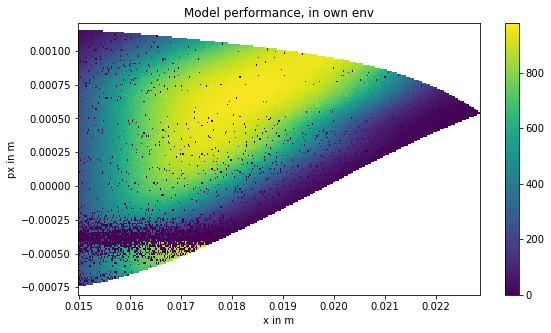

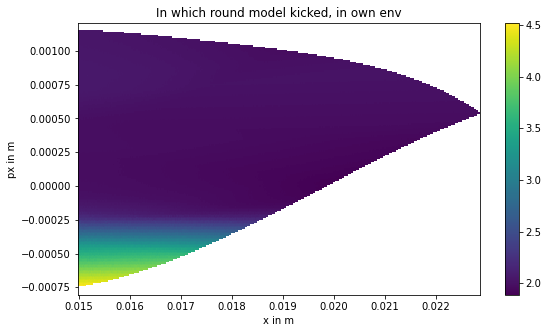

[414.7180323998877, 215.6455953906356, 501.0485349306891]
100%|██████████| 9/9 [25:01<00:00, 1501.82s/trial, best loss: -4.934347850666856]
Run: {'learning_rate': 0.003531299942147838, 'noise_std': 0.27469590690047196, 'pi_NN': 2, 'qf_NN': 2}
Found saved Trials! Loading...
Rerunning from 9 trials to 10 (+1) trials
Using cuda device                                     
Wrapping the env with a `Monitor` wrapper             
Wrapping the env in a DummyVecEnv.                    
Plot for value                                        
528.2792111743731                                     
 90%|█████████ | 9/10 [07:18<?, ?trial/s, best loss=?]

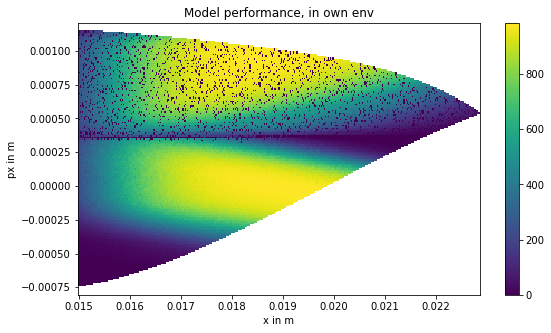

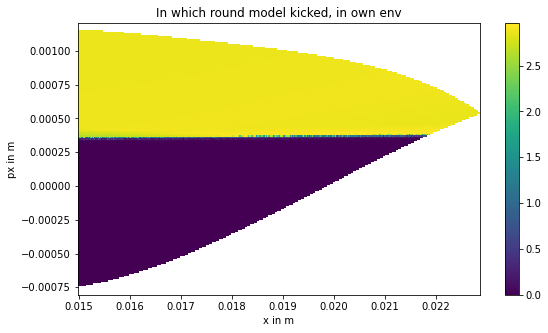

[528.2792111743731]                                   
Using cuda device                                     
Wrapping the env with a `Monitor` wrapper             
Wrapping the env in a DummyVecEnv.                    
Plot for value                                        
536.6431331705263                                     
 90%|█████████ | 9/10 [14:23<?, ?trial/s, best loss=?]

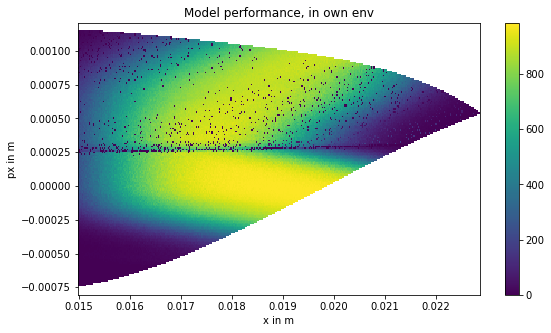

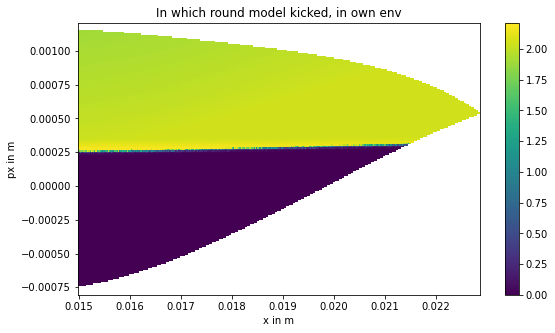

[528.2792111743731, 536.6431331705263]                
Using cuda device                                     
Wrapping the env with a `Monitor` wrapper             
Wrapping the env in a DummyVecEnv.                    
Plot for value                                        
501.60209180721154                                    
 90%|█████████ | 9/10 [21:49<?, ?trial/s, best loss=?]

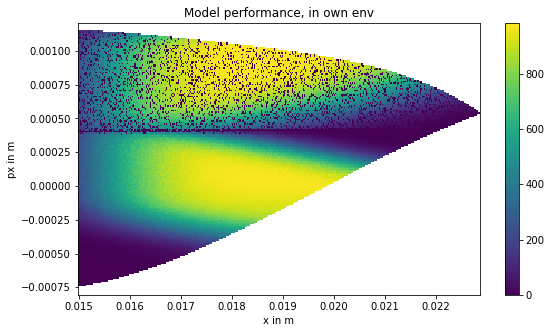

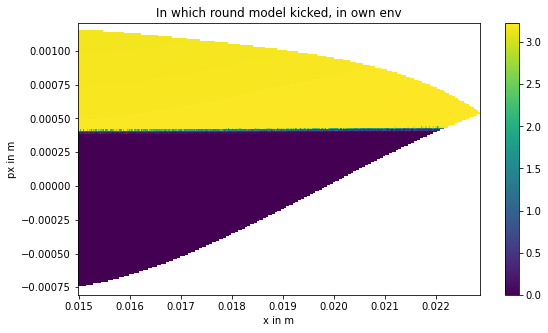

[528.2792111743731, 536.6431331705263, 501.60209180721154]
100%|██████████| 10/10 [21:50<00:00, 1310.18s/trial, best loss: -5.221748120507037]
Run: {'learning_rate': 0.004940180283349618, 'noise_std': 1.8322335207073175, 'pi_NN': 0, 'qf_NN': 4}
Found saved Trials! Loading...
Rerunning from 10 trials to 11 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
477.98966656727015                                     
[477.98966656727015]                                   
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
500.26379833367395                                     
 91%|█████████ | 10/11 [15:56<?, ?trial/s, best loss=?]

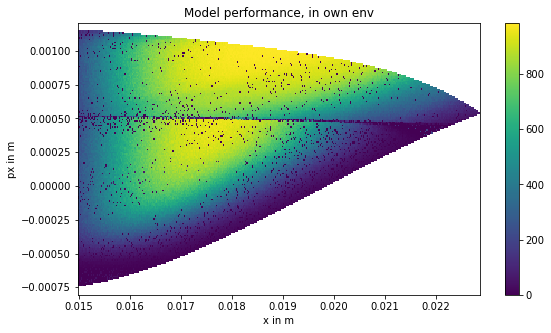

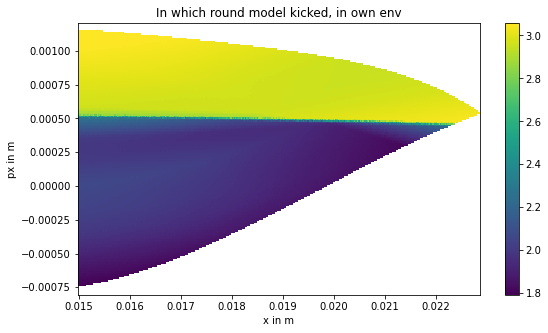

[477.98966656727015, 500.26379833367395]               
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
560.188584281411                                       
 91%|█████████ | 10/11 [23:25<?, ?trial/s, best loss=?]

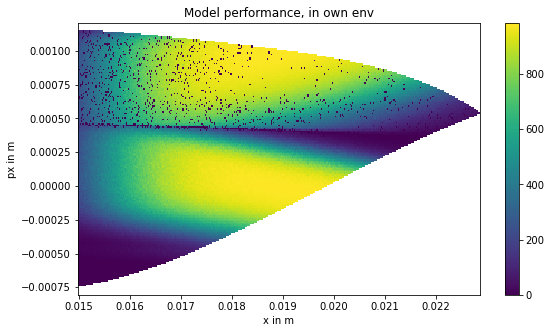

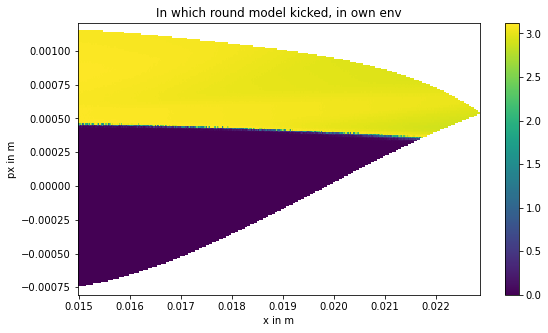

[477.98966656727015, 500.26379833367395, 560.188584281411]
100%|██████████| 11/11 [23:25<00:00, 1405.78s/trial, best loss: -5.221748120507037]
Run: {'learning_rate': 0.004940180283349618, 'noise_std': 1.8322335207073175, 'pi_NN': 0, 'qf_NN': 4}
Found saved Trials! Loading...
Rerunning from 11 trials to 12 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
275.6012086490428                                      
[275.6012086490428]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
500.36647212546615                                     
 92%|█████████▏| 11/12 [14:52<?, ?trial/s, best loss=?]

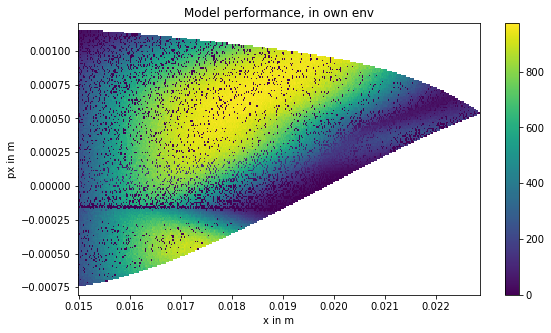

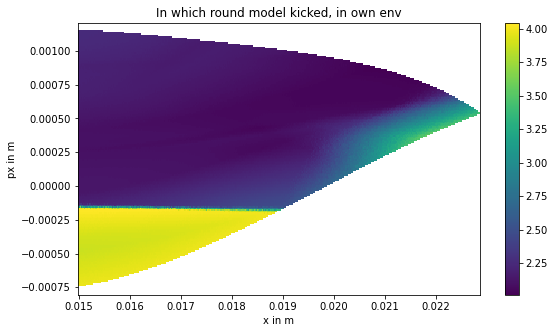

[275.6012086490428, 500.36647212546615]                
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
502.1686631871148                                      
 92%|█████████▏| 11/12 [22:52<?, ?trial/s, best loss=?]

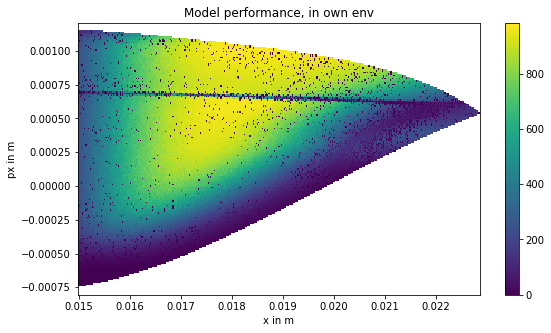

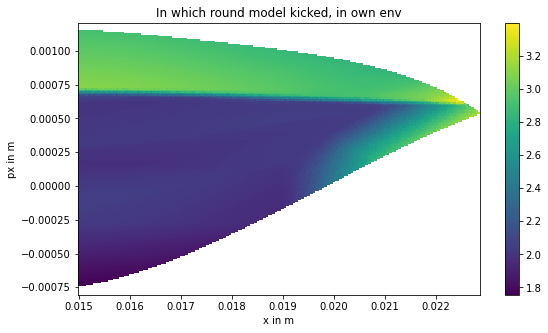

[275.6012086490428, 500.36647212546615, 502.1686631871148]
100%|██████████| 12/12 [22:53<00:00, 1373.07s/trial, best loss: -5.221748120507037]
Run: {'learning_rate': 0.004940180283349618, 'noise_std': 1.8322335207073175, 'pi_NN': 0, 'qf_NN': 4}
Found saved Trials! Loading...
Rerunning from 12 trials to 13 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
511.1576513514939                                      
 92%|█████████▏| 12/13 [07:12<?, ?trial/s, best loss=?]

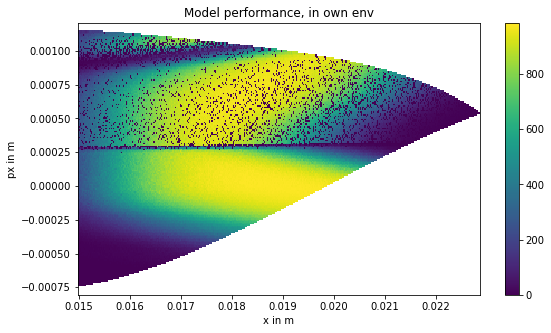

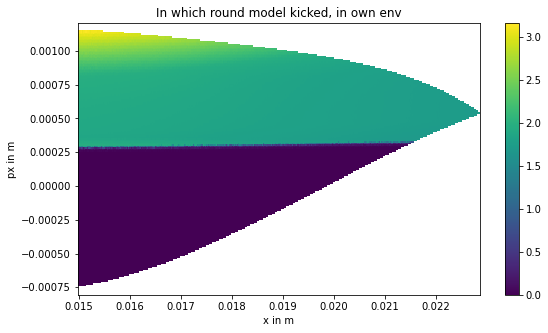

[511.1576513514939]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
274.1521836868828                                      
[511.1576513514939, 274.1521836868828]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
558.9943296916109                                      
 92%|█████████▏| 12/13 [21:00<?, ?trial/s, best loss=?]

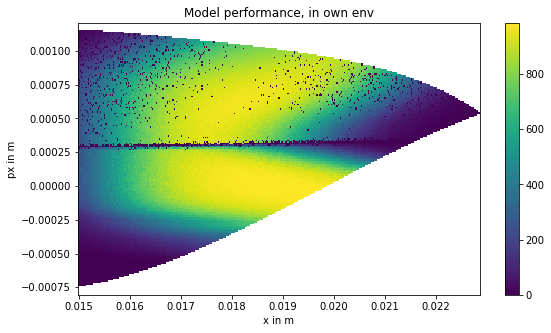

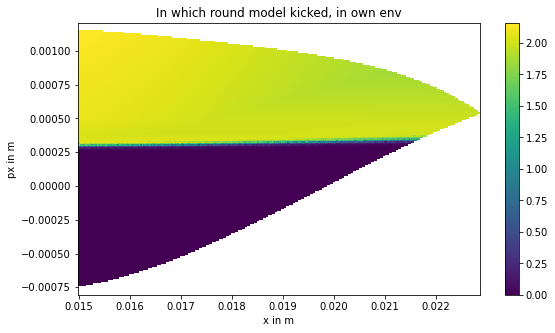

[511.1576513514939, 274.1521836868828, 558.9943296916109]
100%|██████████| 13/13 [21:01<00:00, 1261.22s/trial, best loss: -5.221748120507037]
Run: {'learning_rate': 0.004940180283349618, 'noise_std': 1.8322335207073175, 'pi_NN': 0, 'qf_NN': 4}
Found saved Trials! Loading...
Rerunning from 13 trials to 14 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
478.10814860336194                                     
[478.10814860336194]                                   
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
461.1310160195873                                      
[478.10814860336194, 461.1310160195873]                
Using cuda

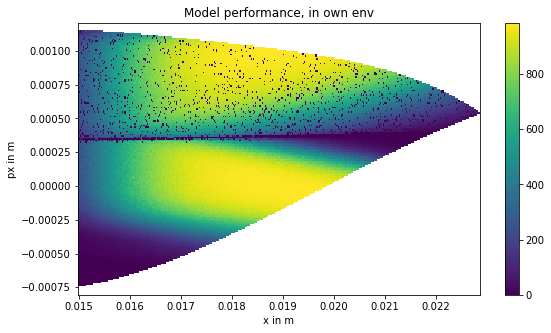

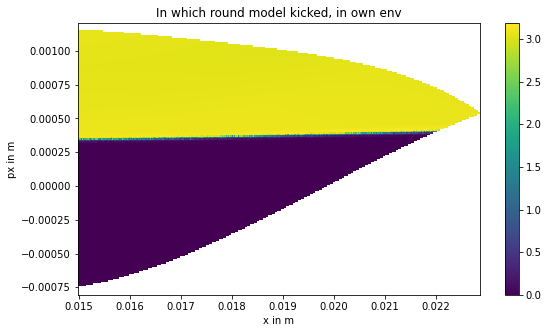

[558.1455225005111]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
459.9110399306667                                      
[558.1455225005111, 459.9110399306667]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
514.7350461423556                                      
 93%|█████████▎| 14/15 [23:46<?, ?trial/s, best loss=?]

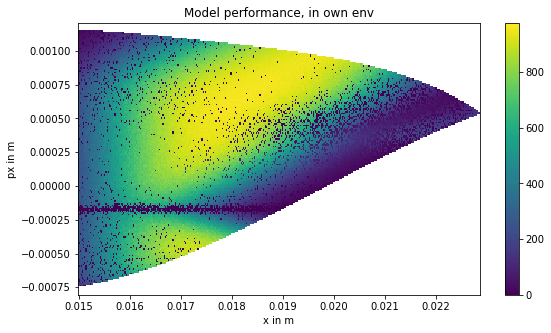

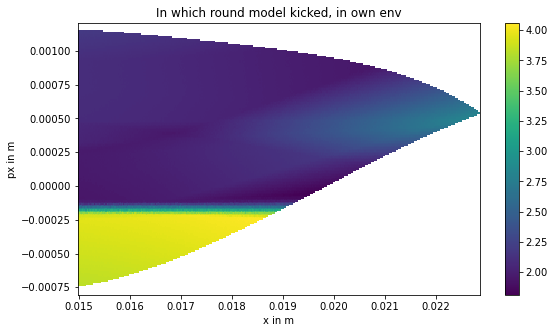

[558.1455225005111, 459.9110399306667, 514.7350461423556]
100%|██████████| 15/15 [23:46<00:00, 1426.51s/trial, best loss: -5.221748120507037]
Run: {'learning_rate': 0.004940180283349618, 'noise_std': 1.8322335207073175, 'pi_NN': 0, 'qf_NN': 4}
Found saved Trials! Loading...
Rerunning from 15 trials to 16 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
371.69231921089056                                     
[371.69231921089056]                                   
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
505.60790050175484                                     
 94%|█████████▍| 15/16 [16:56<?, ?trial/s, best loss=?]

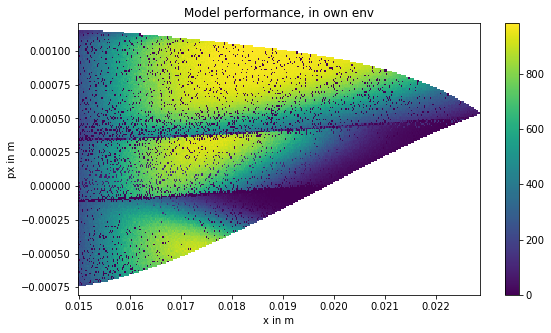

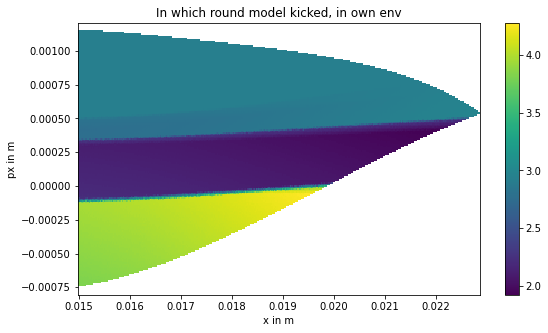

[371.69231921089056, 505.60790050175484]               
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
469.544145976428                                       
[371.69231921089056, 505.60790050175484, 469.544145976428]
100%|██████████| 16/16 [24:45<00:00, 1485.23s/trial, best loss: -5.221748120507037]
Run: {'learning_rate': 0.004940180283349618, 'noise_std': 1.8322335207073175, 'pi_NN': 0, 'qf_NN': 4}
Found saved Trials! Loading...
Rerunning from 16 trials to 17 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
521.40454209169                                        
 94%|█████████▍| 16/17 [07:04<?, ?trial/s, best loss=?]

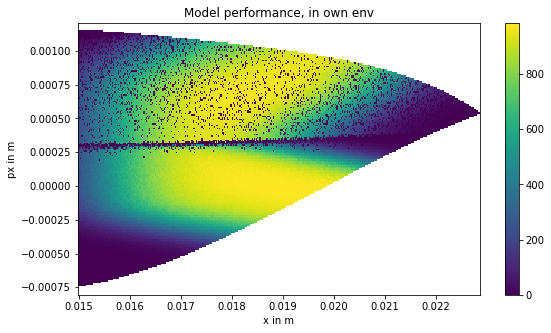

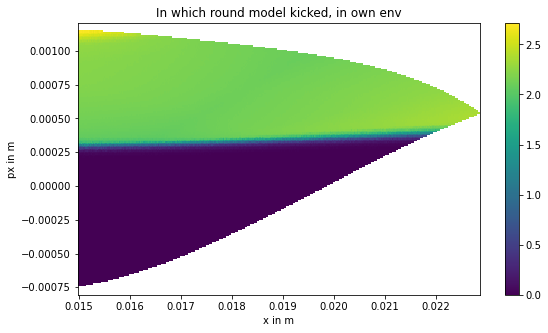

[521.40454209169]                                      
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
480.58277000561037                                     
 94%|█████████▍| 16/17 [14:44<?, ?trial/s, best loss=?]

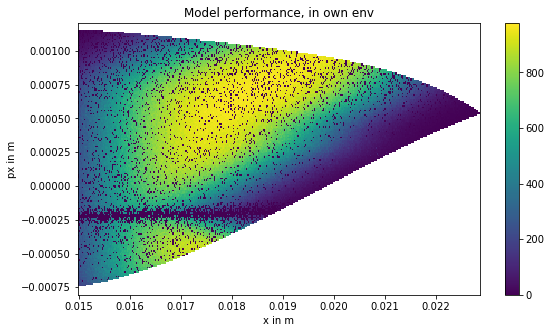

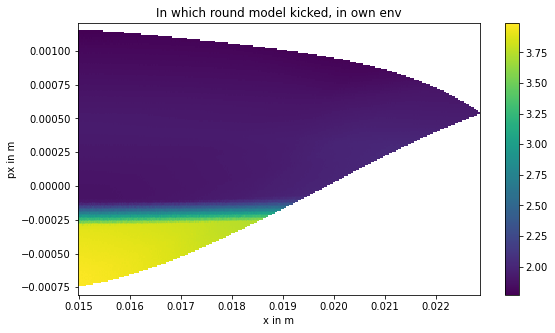

[521.40454209169, 480.58277000561037]                  
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
454.7471835743183                                      
[521.40454209169, 480.58277000561037, 454.7471835743183]
100%|██████████| 17/17 [22:24<00:00, 1344.26s/trial, best loss: -5.221748120507037]
Run: {'learning_rate': 0.004940180283349618, 'noise_std': 1.8322335207073175, 'pi_NN': 0, 'qf_NN': 4}
Found saved Trials! Loading...
Rerunning from 17 trials to 18 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
271.3258502479336                                      
[271.3258502479336]                                    
Using cuda 

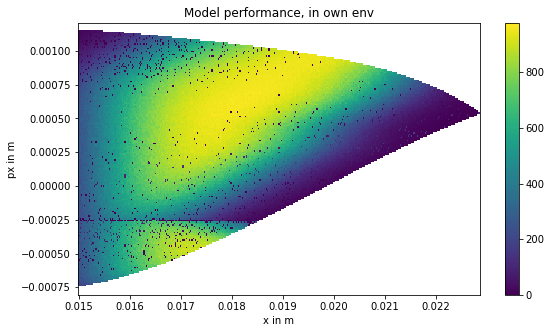

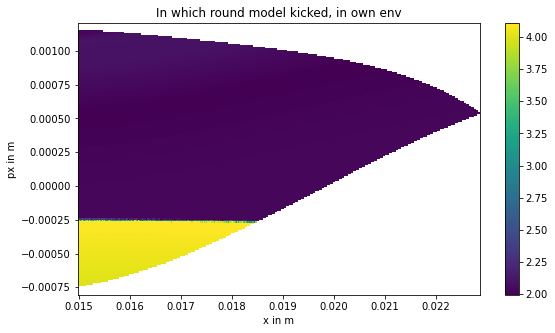

[446.9094292036721, 536.0715807647173]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
477.66257485395425                                     
[446.9094292036721, 536.0715807647173, 477.66257485395425]
100%|██████████| 19/19 [24:58<00:00, 1498.02s/trial, best loss: -5.221748120507037]
Run: {'learning_rate': 0.004940180283349618, 'noise_std': 1.8322335207073175, 'pi_NN': 0, 'qf_NN': 4}
Found saved Trials! Loading...
Rerunning from 19 trials to 20 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
509.94615784562325                                     
 95%|█████████▌| 19/20 [07:14<?, ?trial/s, best loss=?]

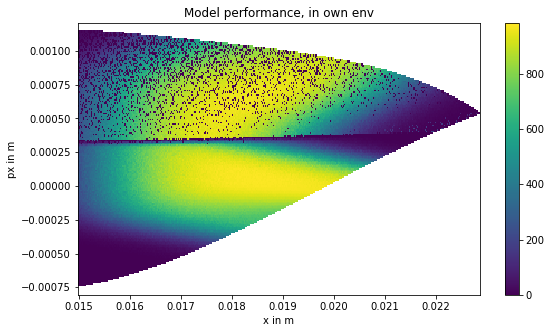

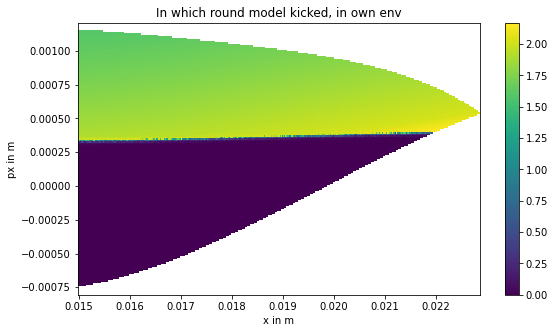

[509.94615784562325]                                   
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
503.1810030988032                                      
 95%|█████████▌| 19/20 [15:15<?, ?trial/s, best loss=?]

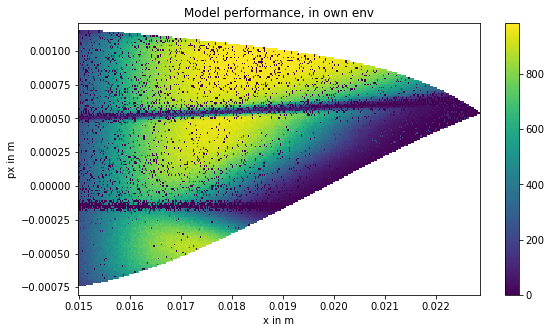

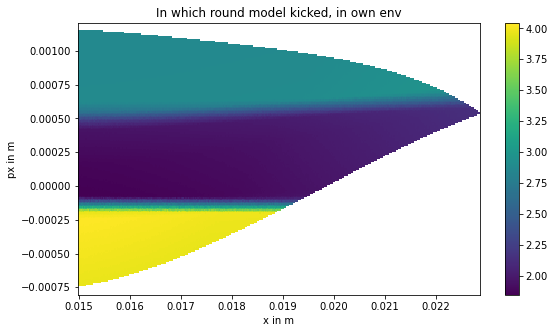

[509.94615784562325, 503.1810030988032]                
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
499.53073070152686                                     
 95%|█████████▌| 19/20 [23:15<?, ?trial/s, best loss=?]

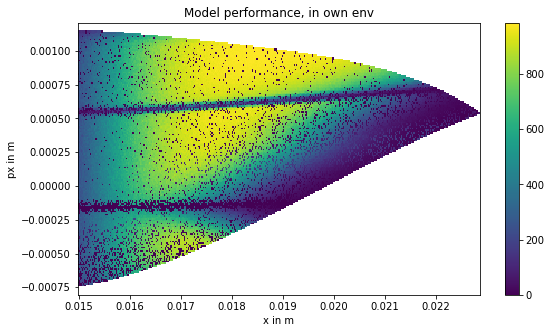

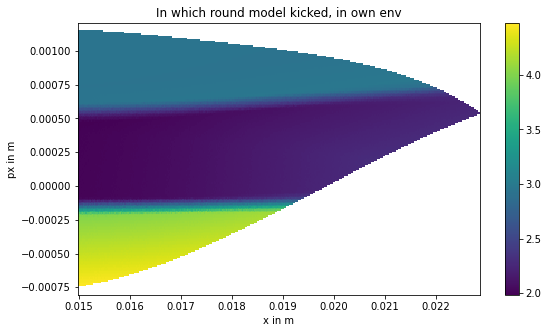

[509.94615784562325, 503.1810030988032, 499.53073070152686]
100%|██████████| 20/20 [23:15<00:00, 1395.63s/trial, best loss: -5.221748120507037]
Run: {'learning_rate': 0.004940180283349618, 'noise_std': 1.8322335207073175, 'pi_NN': 0, 'qf_NN': 4}
Found saved Trials! Loading...
Rerunning from 20 trials to 21 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
451.4787058727683                                      
[451.4787058727683]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
460.236428544732                                       
[451.4787058727683, 460.236428544732]                  
Using cu

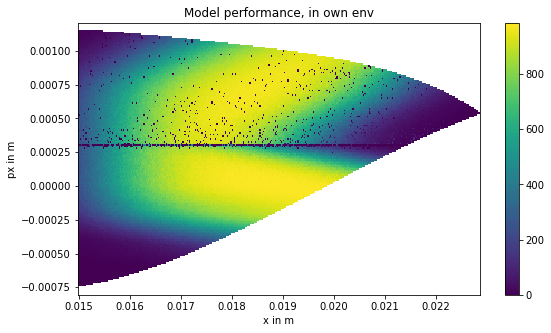

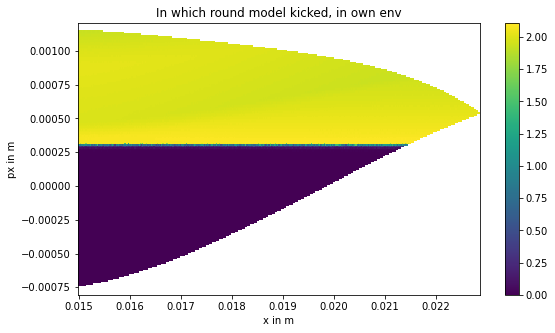

[451.4787058727683, 460.236428544732, 563.8226794063273]
100%|██████████| 21/21 [25:38<00:00, 1538.28s/trial, best loss: -5.221748120507037]
Run: {'learning_rate': 0.004940180283349618, 'noise_std': 1.8322335207073175, 'pi_NN': 0, 'qf_NN': 4}
Found saved Trials! Loading...
Rerunning from 21 trials to 22 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
558.3818473644459                                      
 95%|█████████▌| 21/22 [07:23<?, ?trial/s, best loss=?]

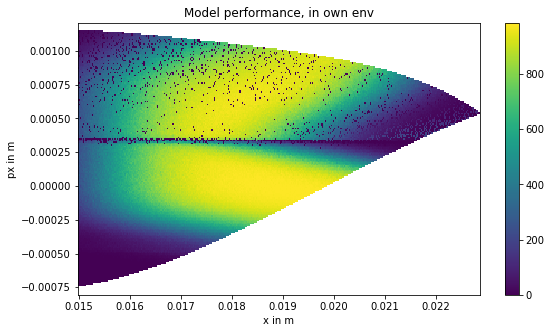

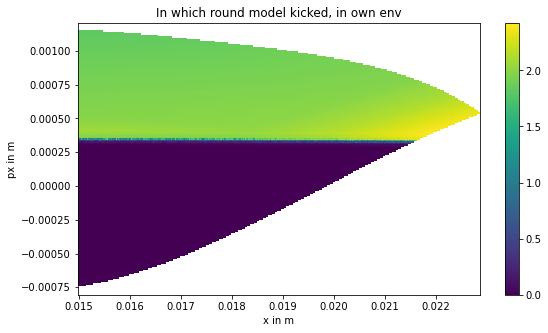

[558.3818473644459]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
523.5493778272531                                      
 95%|█████████▌| 21/22 [15:23<?, ?trial/s, best loss=?]

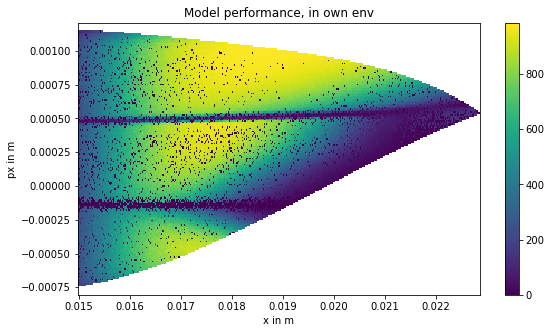

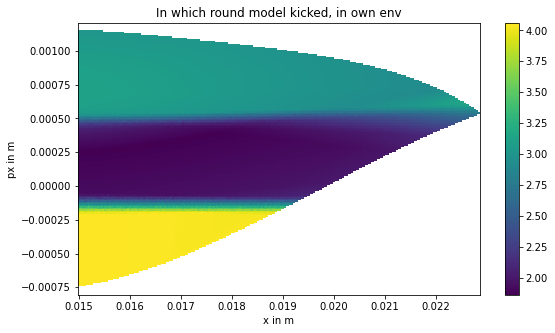

[558.3818473644459, 523.5493778272531]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
546.7652909269157                                      
 95%|█████████▌| 21/22 [22:56<?, ?trial/s, best loss=?]

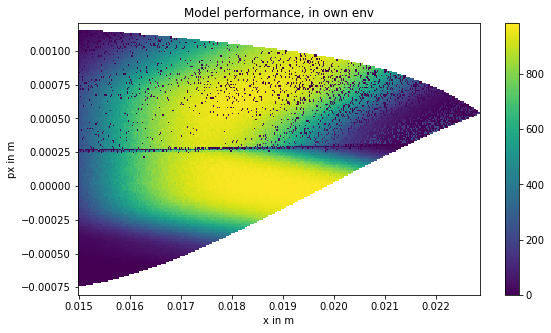

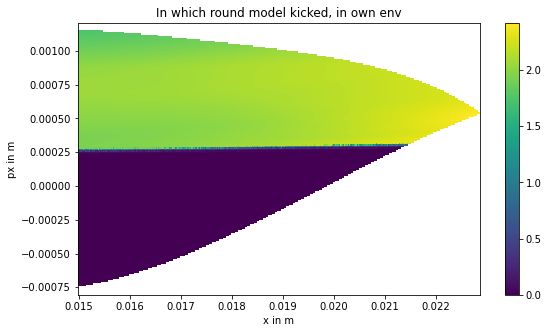

[558.3818473644459, 523.5493778272531, 546.7652909269157]
100%|██████████| 22/22 [22:56<00:00, 1376.40s/trial, best loss: -5.428988387062049]
Run: {'learning_rate': 0.0019615490353811185, 'noise_std': 1.9841795634914337, 'pi_NN': 0, 'qf_NN': 4}
Found saved Trials! Loading...
Rerunning from 22 trials to 23 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
489.62749033398956                                     
 96%|█████████▌| 22/23 [08:48<?, ?trial/s, best loss=?]

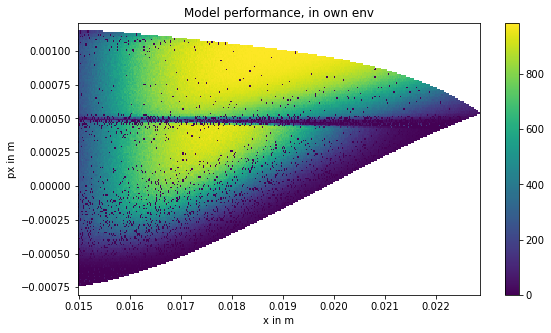

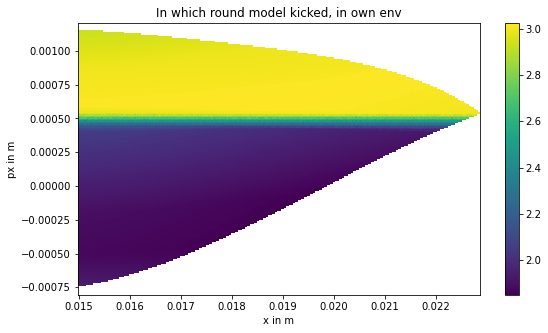

[489.62749033398956]                                   
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
548.8952251587069                                      
 96%|█████████▌| 22/23 [16:46<?, ?trial/s, best loss=?]

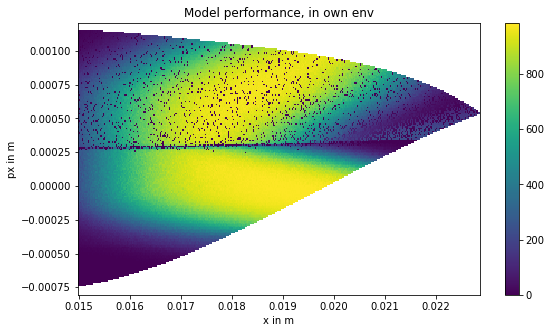

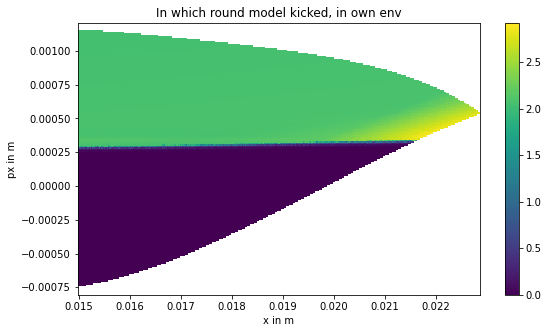

[489.62749033398956, 548.8952251587069]                
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
542.4113836151304                                      
 96%|█████████▌| 22/23 [24:35<?, ?trial/s, best loss=?]

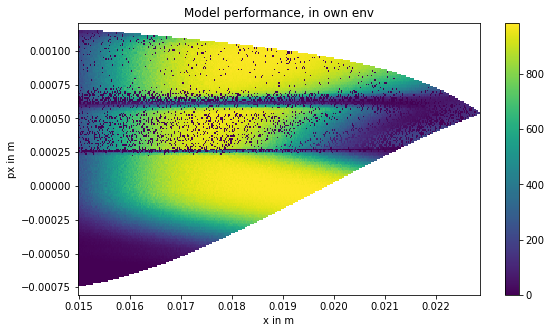

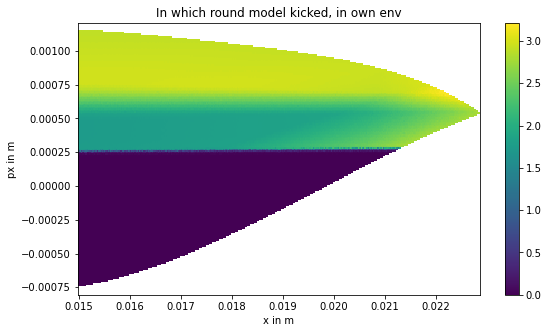

[489.62749033398956, 548.8952251587069, 542.4113836151304]
100%|██████████| 23/23 [24:35<00:00, 1475.66s/trial, best loss: -5.428988387062049]
Run: {'learning_rate': 0.0019615490353811185, 'noise_std': 1.9841795634914337, 'pi_NN': 0, 'qf_NN': 4}
Found saved Trials! Loading...
Rerunning from 23 trials to 24 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
519.6290636151047                                      
 96%|█████████▌| 23/24 [08:15<?, ?trial/s, best loss=?]

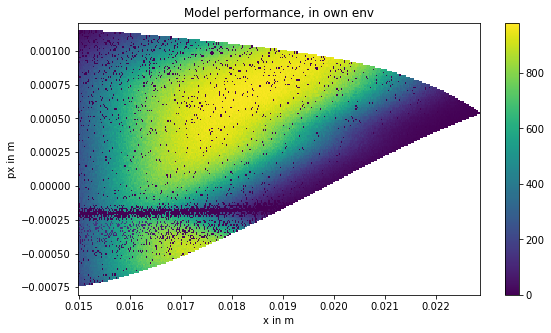

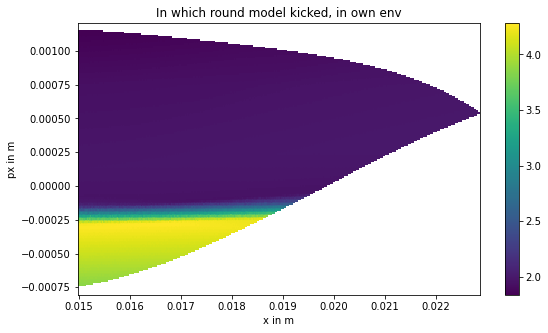

[519.6290636151047]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
 96%|█████████▌| 23/24 [11:55<?, ?trial/s, best loss=?]

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-10-cf90a164e674>", line 2, in <module>
    run_trials()
  File "<ipython-input-9-80ffb68b219d>", line 21, in run_trials
    best = fmin(fn = objective,
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/fmin.py", line 540, in fmin
    return trials.fmin(
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/base.py", line 671, in fmin
    return fmin(
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/fmin.py", line 586, in fmin
    rval.exhaust()
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/fmin.py", line 364, in exhaust
    self.run(self.max_evals - n_done, block_until_done=self.asynchronous)
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/fmin.py", line 300, in r


KeyboardInterrupt



In [9]:
for k in range(300):
    run_trials()

Found saved Trials! Loading...
Rerunning from 23 trials to 24 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
274.8113561969518                                      
[274.8113561969518]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
501.9767765325109                                      
 96%|█████████▌| 23/24 [13:54<?, ?trial/s, best loss=?]

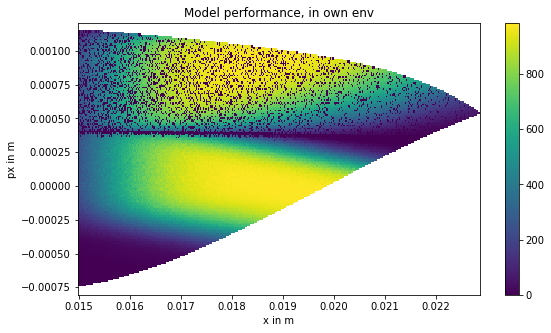

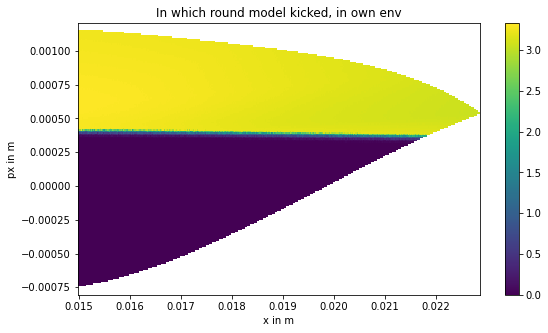

[274.8113561969518, 501.9767765325109]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
453.9109757019462                                      
[274.8113561969518, 501.9767765325109, 453.9109757019462]
100%|██████████| 24/24 [21:59<00:00, 1319.67s/trial, best loss: -5.428988387062049]
Run: {'learning_rate': 0.0019615490353811185, 'noise_std': 1.9841795634914337, 'pi_NN': 0, 'qf_NN': 4}
Found saved Trials! Loading...
Rerunning from 24 trials to 25 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
442.01301704189547                                     
[442.01301704189547]                                   
Using cud

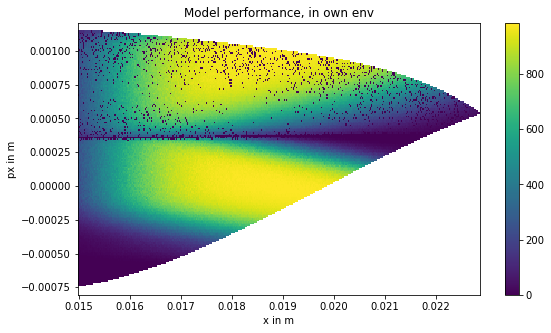

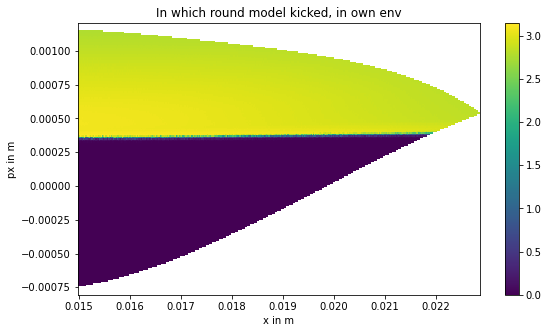

[442.01301704189547, 545.8734376847859]                
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
473.574776507291                                       
[442.01301704189547, 545.8734376847859, 473.574776507291]
100%|██████████| 25/25 [24:08<00:00, 1448.27s/trial, best loss: -5.428988387062049]
Run: {'learning_rate': 0.0019615490353811185, 'noise_std': 1.9841795634914337, 'pi_NN': 0, 'qf_NN': 4}
Found saved Trials! Loading...
Rerunning from 25 trials to 26 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
565.7429065100666                                      
 96%|█████████▌| 25/26 [07:08<?, ?trial/s, best loss=?]

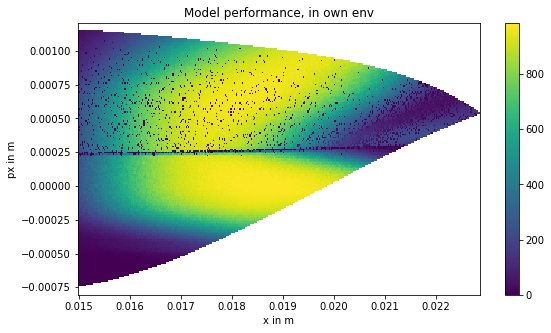

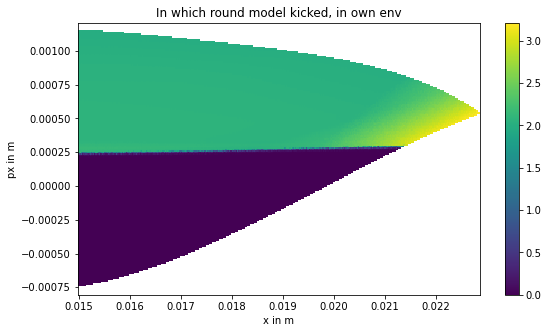

[565.7429065100666]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
450.7058414635738                                      
[565.7429065100666, 450.7058414635738]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
414.9887990496845                                      
[565.7429065100666, 450.7058414635738, 414.9887990496845]
100%|██████████| 26/26 [24:16<00:00, 1456.81s/trial, best loss: -5.428988387062049]
Run: {'learning_rate': 0.0019615490353811185, 'noise_std': 1.9841795634914337, 'pi_NN': 0, 'qf_NN': 4}
Found saved Trials! Loading...
Rerunning from 26 trials to 27 (+1) trials
Using cud

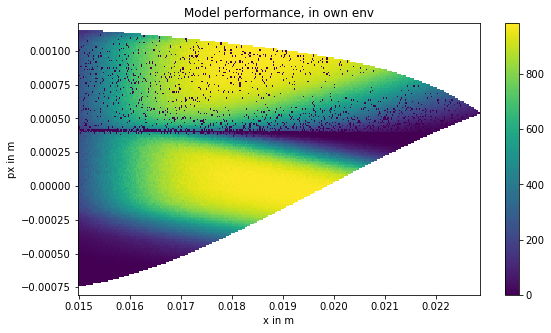

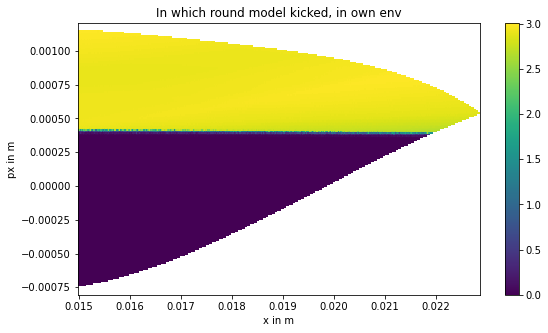

[420.7161671939565, 556.0056765148307]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
544.4098823361759                                      
 96%|█████████▋| 26/27 [23:36<?, ?trial/s, best loss=?]

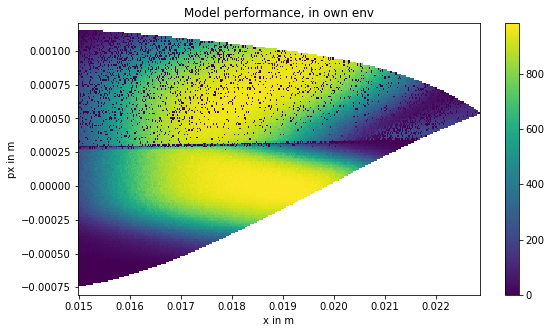

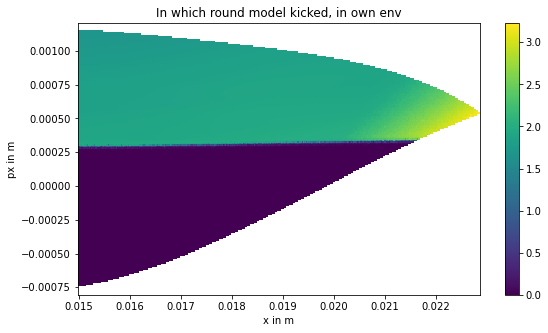

[420.7161671939565, 556.0056765148307, 544.4098823361759]
100%|██████████| 27/27 [23:36<00:00, 1416.61s/trial, best loss: -5.428988387062049]
Run: {'learning_rate': 0.0019615490353811185, 'noise_std': 1.9841795634914337, 'pi_NN': 0, 'qf_NN': 4}
Found saved Trials! Loading...
Rerunning from 27 trials to 28 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
498.9918522999076                                      
 96%|█████████▋| 27/28 [08:09<?, ?trial/s, best loss=?]

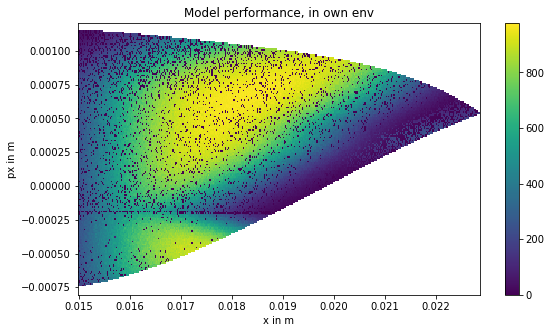

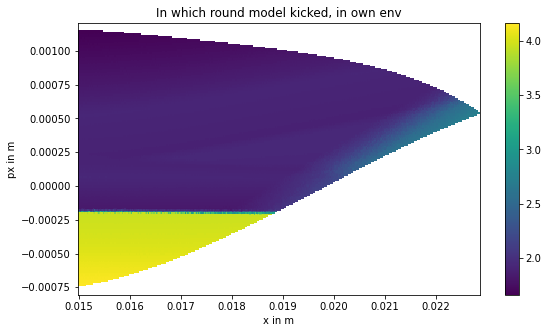

[498.9918522999076]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
537.3322979619692                                      
 96%|█████████▋| 27/28 [16:13<?, ?trial/s, best loss=?]

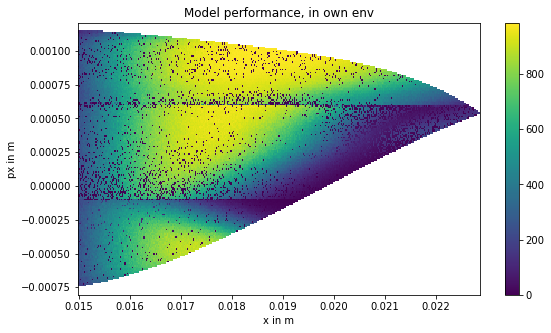

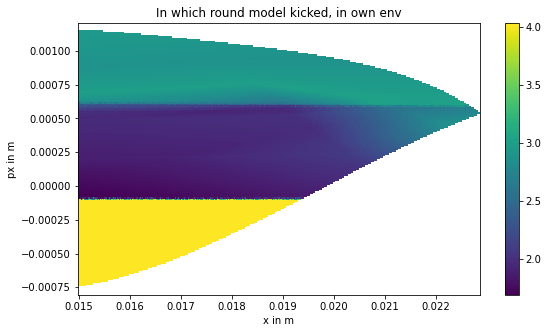

[498.9918522999076, 537.3322979619692]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
550.1460185446389                                      
 96%|█████████▋| 27/28 [23:45<?, ?trial/s, best loss=?]

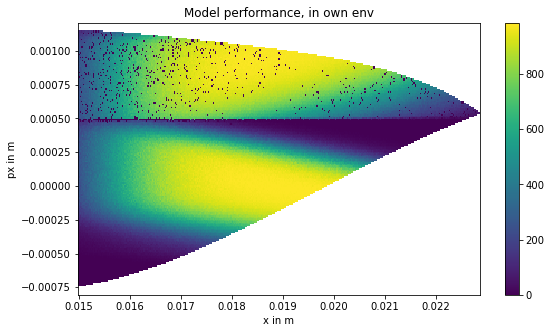

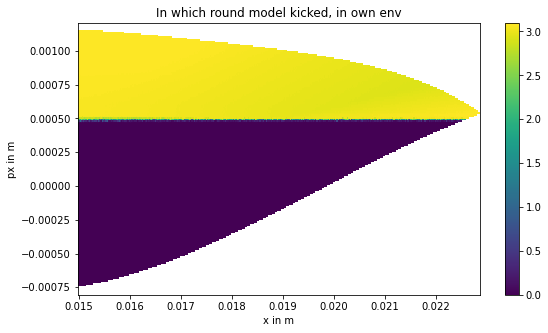

[498.9918522999076, 537.3322979619692, 550.1460185446389]
100%|██████████| 28/28 [23:45<00:00, 1425.52s/trial, best loss: -5.428988387062049]
Run: {'learning_rate': 0.0019615490353811185, 'noise_std': 1.9841795634914337, 'pi_NN': 0, 'qf_NN': 4}
Found saved Trials! Loading...
Rerunning from 28 trials to 29 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
7.5406903561631475                                     
[7.5406903561631475]                                   
BREAK                                                  
7.5406903561631475                                     
50                                                     
100%|██████████| 29/29 [06:46<00:00, 406.51s/trial, best loss: -5.428988387062049]
Run: {'learning_rate': 0.0019615490353811185, 'noise_std': 1.9841795634914337, 'pi_NN': 0, 'qf

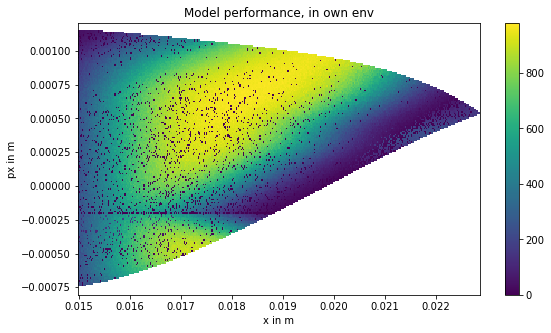

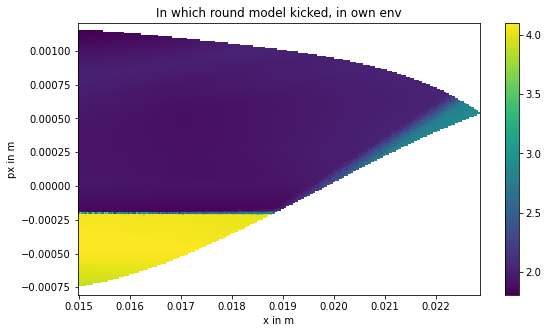

[527.6433531465798]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
541.7710787760439                                      
 97%|█████████▋| 29/30 [16:19<?, ?trial/s, best loss=?]

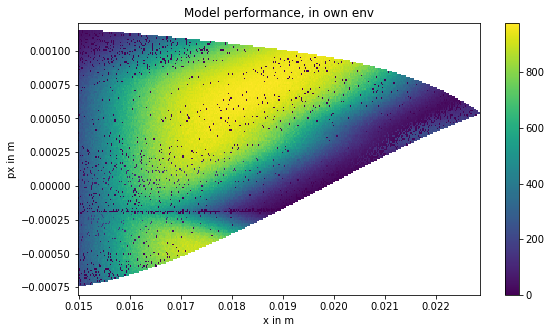

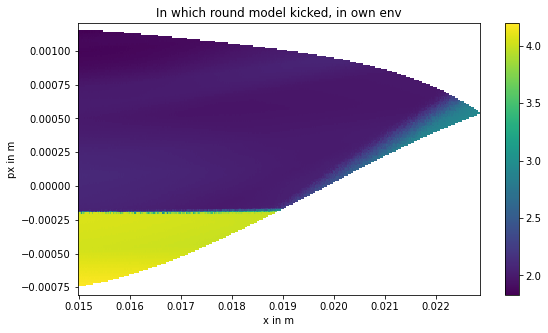

[527.6433531465798, 541.7710787760439]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
577.9207664975474                                      
 97%|█████████▋| 29/30 [24:14<?, ?trial/s, best loss=?]

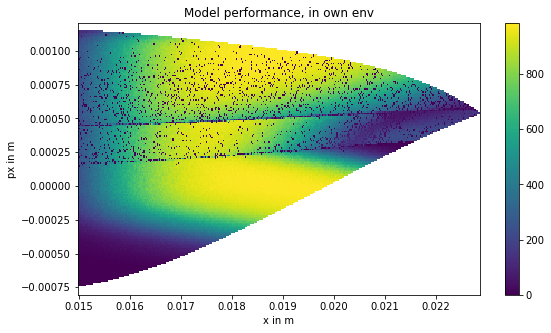

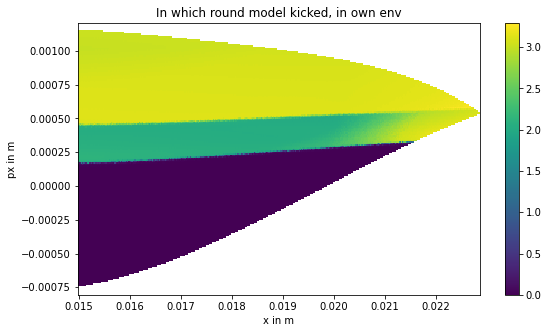

[527.6433531465798, 541.7710787760439, 577.9207664975474]
100%|██████████| 30/30 [24:14<00:00, 1454.45s/trial, best loss: -5.4911173280672365]
Run: {'learning_rate': 0.0009797476525611724, 'noise_std': 1.983802254193777, 'pi_NN': 2, 'qf_NN': 2}
Found saved Trials! Loading...
Rerunning from 30 trials to 31 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
525.3049625266638                                      
 97%|█████████▋| 30/31 [08:18<?, ?trial/s, best loss=?]

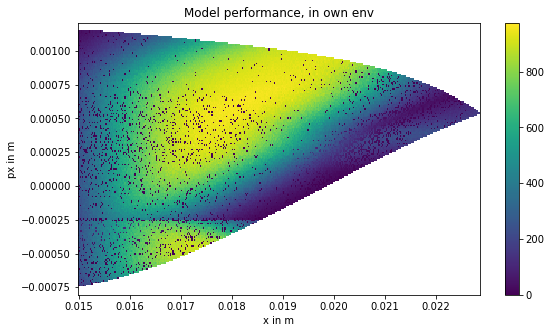

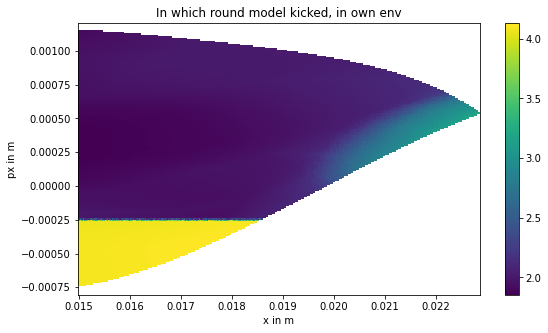

[525.3049625266638]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
560.1863323797073                                      
 97%|█████████▋| 30/31 [16:09<?, ?trial/s, best loss=?]

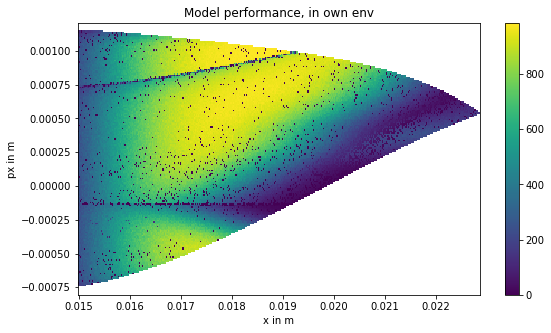

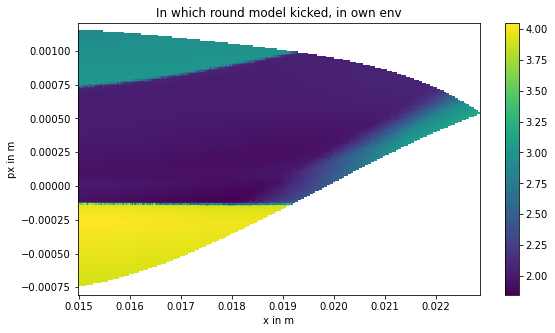

[525.3049625266638, 560.1863323797073]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
580.818303242798                                       
 97%|█████████▋| 30/31 [23:49<?, ?trial/s, best loss=?]

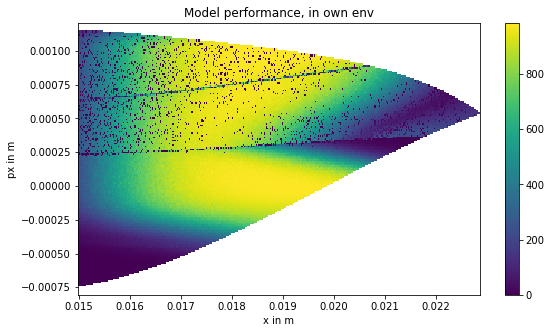

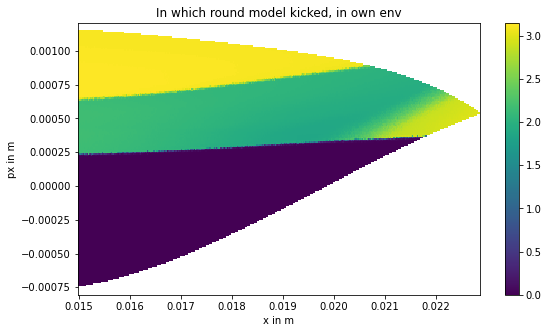

[525.3049625266638, 560.1863323797073, 580.818303242798]
100%|██████████| 31/31 [23:49<00:00, 1429.60s/trial, best loss: -5.554365327163897]
Run: {'learning_rate': 0.0011213399173224557, 'noise_std': 1.5713043215060054, 'pi_NN': 2, 'qf_NN': 2}
Found saved Trials! Loading...
Rerunning from 31 trials to 32 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
557.6436182042025                                      
 97%|█████████▋| 31/32 [07:59<?, ?trial/s, best loss=?]

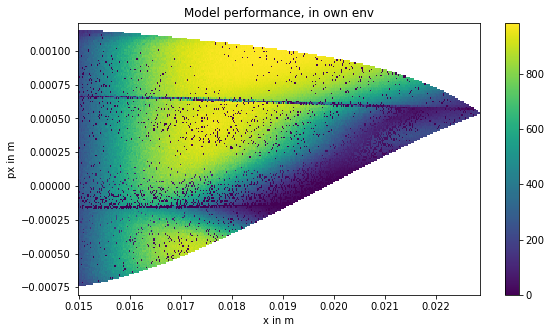

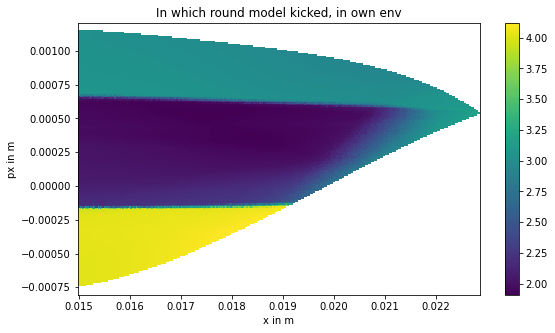

[557.6436182042025]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
592.7925942304392                                      
 97%|█████████▋| 31/32 [15:31<?, ?trial/s, best loss=?]

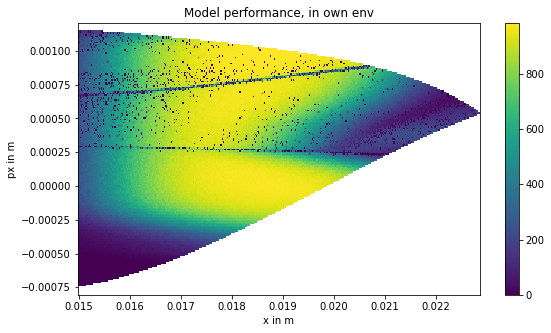

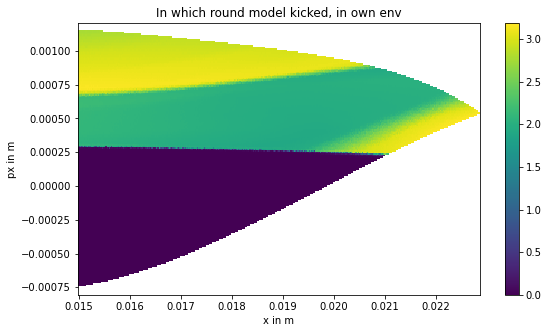

[557.6436182042025, 592.7925942304392]                 
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
518.3632757001257                                      
 97%|█████████▋| 31/32 [23:16<?, ?trial/s, best loss=?]

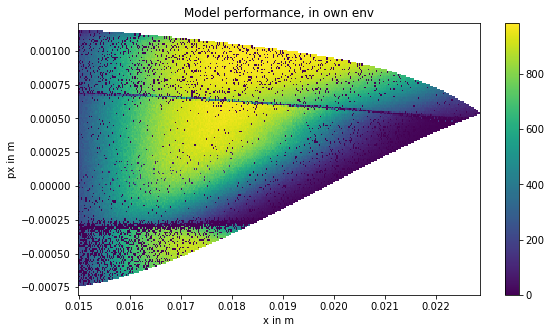

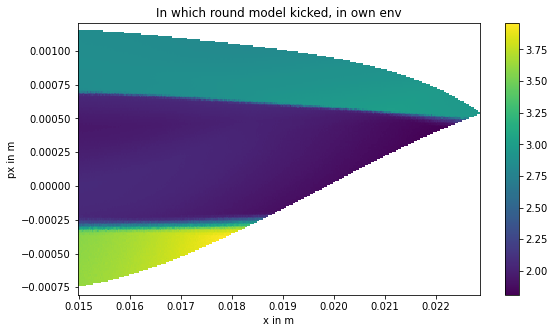

[557.6436182042025, 592.7925942304392, 518.3632757001257]
100%|██████████| 32/32 [23:17<00:00, 1397.04s/trial, best loss: -5.562664960449224]
Run: {'learning_rate': 0.0009919426583000727, 'noise_std': 1.4776942740085168, 'pi_NN': 2, 'qf_NN': 2}
Found saved Trials! Loading...
Rerunning from 32 trials to 33 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
471.8438395030373                                      
[471.8438395030373]                                    
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
443.7166466364613                                      
[471.8438395030373, 443.7166466364613]                 
Using cud

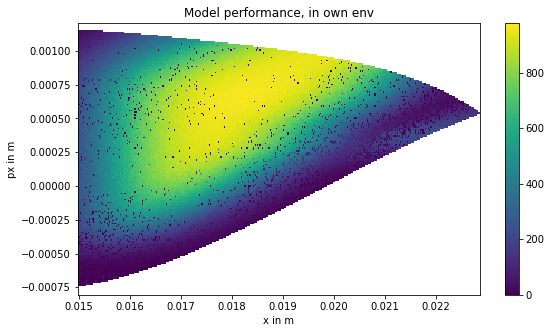

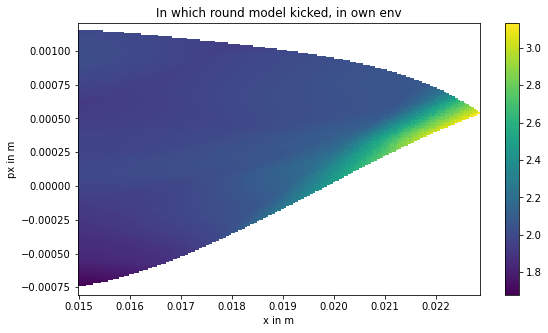

[491.102833763141]                                     
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
524.2127378885733                                      
 97%|█████████▋| 33/34 [15:56<?, ?trial/s, best loss=?]

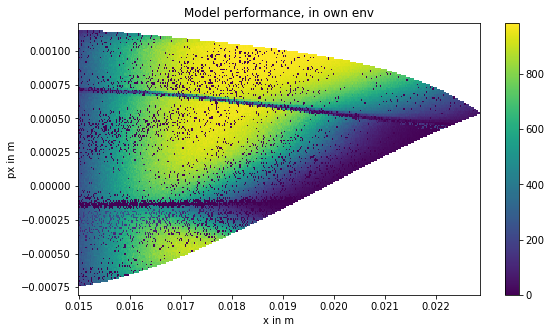

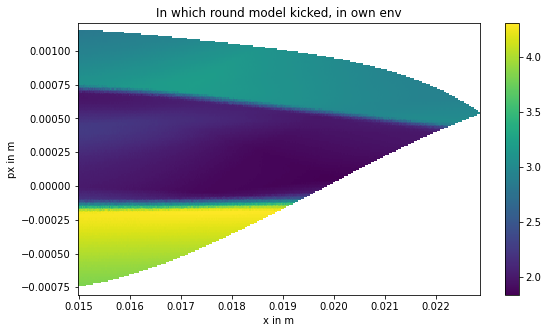

[491.102833763141, 524.2127378885733]                  
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
Plot for value                                         
468.825047237239                                       
[491.102833763141, 524.2127378885733, 468.825047237239]
100%|██████████| 34/34 [24:37<00:00, 1477.82s/trial, best loss: -5.562664960449224]
Run: {'learning_rate': 0.0009919426583000727, 'noise_std': 1.4776942740085168, 'pi_NN': 2, 'qf_NN': 2}
Found saved Trials! Loading...
Rerunning from 34 trials to 35 (+1) trials
Using cuda device                                      
Wrapping the env with a `Monitor` wrapper              
Wrapping the env in a DummyVecEnv.                     
 97%|█████████▋| 34/35 [05:35<?, ?trial/s, best loss=?]

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-10-cf90a164e674>", line 2, in <module>
    run_trials()
  File "<ipython-input-9-80ffb68b219d>", line 21, in run_trials
    best = fmin(fn = objective,
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/fmin.py", line 540, in fmin
    return trials.fmin(
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/base.py", line 671, in fmin
    return fmin(
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/fmin.py", line 586, in fmin
    rval.exhaust()
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/fmin.py", line 364, in exhaust
    self.run(self.max_evals - n_done, block_until_done=self.asynchronous)
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/fmin.py", line 300, in r

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3437, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-10-cf90a164e674>", line 2, in <module>
    run_trials()
  File "<ipython-input-9-80ffb68b219d>", line 21, in run_trials
    best = fmin(fn = objective,
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/fmin.py", line 540, in fmin
    return trials.fmin(
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/base.py", line 671, in fmin
    return fmin(
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/fmin.py", line 586, in fmin
    rval.exhaust()
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/fmin.py", line 364, in exhaust
    self.run(self.max_evals - n_done, block_until_done=self.asynchronous)
  File "/home/al3xber/anaconda3/lib/python3.8/site-packages/hyperopt/fmin.py", line 300, in r

In [ ]:
for k in range(300):
    run_trials()